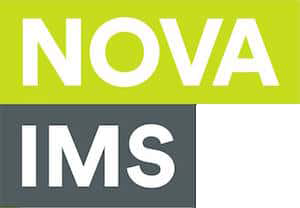
**Data Mining Project 2023/2024**

Diogo Silva 20201643

Hugo Miguel 20230745

## **Data Exploration** 

In [ ]:
# Instalations

#!pip install ydata-profiling

In [ ]:
# Imports

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil
import os
import math
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.impute import KNNImputer
from scipy.stats import boxcox
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples, pairwise_distances
from sklearn.cluster import AgglomerativeClustering, MeanShift, DBSCAN, estimate_bandwidth
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import dendrogram
from sklearn.base import clone
from sklearn.cluster import KMeans
import matplotlib.cm as cm
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
#from ydata_profiling import ProfileReport

In [ ]:
# Better resolution plots (VI NA PRATICA LAB01)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set()

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Import Dataset

data = pd.read_csv('XYZ_sports_dataset.csv', delimiter = ';')

### **Initial Analysis**

In [ ]:
# Check head
data.head(10)

,ID,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
0,10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
1,10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,...,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
2,10002,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,...,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
3,10003,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
4,10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,...,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1
5,10005,24,Female,2220.0,2015-12-01,2016-07-31,2016-01-01,2016-12-31,2016-07-28,3,...,0.0,28.0,0,7.0,59.01,26,0,0.0,0,1
6,10006,23,Male,2340.0,2015-10-06,2019-04-11,2019-01-01,2019-06-30,2019-03-26,16,...,0.0,22.0,0,7.0,30.03,3,3,0.0,0,1
7,10007,23,Male,1910.0,2015-03-25,2019-07-31,2019-01-01,2019-06-30,2019-04-23,99,...,0.0,34.0,0,7.0,60.97,11,5,0.0,0,1
8,10008,29,Male,3220.0,2016-04-08,2017-06-07,2017-01-01,2017-06-30,2017-03-30,69,...,0.0,6.0,0,7.0,60.97,0,2,0.0,0,1
9,10009,14,Female,0.0,2016-07-07,2017-02-01,2016-07-01,2017-06-30,2016-11-19,74,...,0.0,6.0,6,2.0,17.72,0,2,0.0,0,1


In [ ]:
# Change 'ID' values to start at 0
data['ID'] = data['ID'] - 10000

# Set the column 'ID' as index
data.set_index('ID', inplace=True)

In [ ]:
data.head(10)

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
1,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,...,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
2,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,...,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
3,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
4,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,...,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1
5,24,Female,2220.0,2015-12-01,2016-07-31,2016-01-01,2016-12-31,2016-07-28,3,140.00,...,0.0,28.0,0,7.0,59.01,26,0,0.0,0,1
6,23,Male,2340.0,2015-10-06,2019-04-11,2019-01-01,2019-06-30,2019-03-26,16,143.50,...,0.0,22.0,0,7.0,30.03,3,3,0.0,0,1
7,23,Male,1910.0,2015-03-25,2019-07-31,2019-01-01,2019-06-30,2019-04-23,99,233.90,...,0.0,34.0,0,7.0,60.97,11,5,0.0,0,1
8,29,Male,3220.0,2016-04-08,2017-06-07,2017-01-01,2017-06-30,2017-03-30,69,212.60,...,0.0,6.0,0,7.0,60.97,0,2,0.0,0,1


In [ ]:
# Check general info
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14942 entries, 0 to 14941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14942 non-null  int64  
 1   Gender                      14942 non-null  object 
 2   Income                      14447 non-null  float64
 3   EnrollmentStart             14942 non-null  object 
 4   EnrollmentFinish            14942 non-null  object 
 5   LastPeriodStart             14942 non-null  object 
 6   LastPeriodFinish            14942 non-null  object 
 7   DateLastVisit               14942 non-null  object 
 8   DaysWithoutFrequency        14942 non-null  int64  
 9   LifetimeValue               14942 non-null  float64
 10  UseByTime                   14942 non-null  int64  
 11  AthleticsActivities         14906 non-null  float64
 12  WaterActivities             14905 non-null  float64
 13  FitnessActivities           149

In [ ]:
# Check unique values for each column

unique_values_per_column = {}

for column in data.columns:
    unique_values = pd.unique(data[column])
    unique_values_per_column[column] = unique_values

for column, unique_values in unique_values_per_column.items():
    print(f"Column '{column}':")
    print(unique_values)
    print("\n")

Column 'Age':
[60 29 23  9 35 24 14 20 63 12 28 26 47 39 19 30 43 44 13 17 22 21  2  1
 74 38 46 34  6 11 42 56 33 52 54 32  7 27  3 37 31 49 57 15  8 83  5 53
 40 41 45 18 64 51 25 69 55 48 16 10 72 62 36  4 78 50 67 66 59 86 81 73
 65  0 68 80 58 76 85 61 75 82 71 70 79 77 84 87]


Column 'Gender':
['Female' 'Male']


Column 'Income':
[ 5500.  2630.  1980.     0.  4320.  2220.  2340.  1910.  3220.  1800.
  2790.  4040.  2050.  2580.  4490.  3890.  1660.  2510.  3020.  2120.
  3340.  1710.  2520.  1290.  1970.  1230.  1520.  1820.  1670.  5210.
  1720.  1620.  3300.  2100.  1360.  1500.  2190.  3580.  1650.  4250.
  6540.  2020.  1440.  7210.  4910.  1680.  1730.  2960.  2130.  2490.
  5230.    nan  4790.  2320.  2500.  2590.  2530.  3180.  2110.  1490.
  4990.  1600.  5690.  3780.  1810.  3270.  1300.  1310.  5080.  1890.
  6490.  1450.  2540.  1590.  1690.  2730.  6080.  2250.  2800.  1610.
  4010.  3570.  2370.  2690.  5700.  2610.  5600.  1060.  1350.  1530.
  1900.  4970.  2900. 

**Important notes:**

*   'DanceActivities' and 'NatureActivities' have only one value (not counting nan)

**After evaluating Pandas Profiling Report**
- 'OtherActivities' only has 28/14 907 records with values '1' (True) meaning has extremely low variability
- 'AttendedClasses' has ~70% zeros, showing extremely low variability aswell
- Both 'HasReferences' and 'NumberOfReferences' show values extremely one-sided
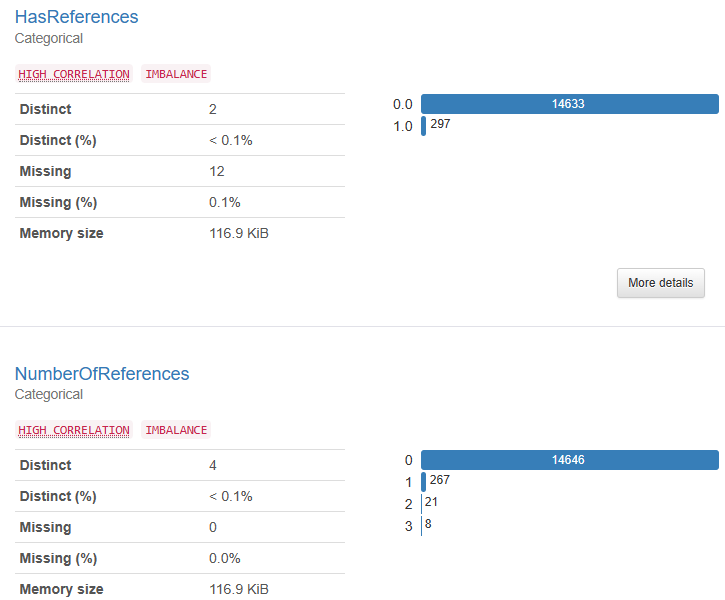

In [ ]:
# Check if there are Duplicates
data[data.duplicated(keep=False)]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
8942,12,Female,0.0,2019-06-18,2019-09-10,2019-07-01,2019-12-31,2019-07-31,41,73.35,...,0.0,14.0,7,5.0,44.3,10,1,0.0,0,1
12873,12,Female,0.0,2019-06-18,2019-09-10,2019-07-01,2019-12-31,2019-07-31,41,73.35,...,0.0,14.0,7,5.0,44.3,10,1,0.0,0,1


In [ ]:
# Delete Duplicates
data.drop_duplicates(inplace=True)

# Check final duplicates value
data.duplicated().sum()

0

In [ ]:
# Descriptive statistics
# Check metric
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14941.0,26.016732,14.156592,0.00,19.00,23.00,31.00,87.00
Income,14446.0,2230.970511,1566.471988,0.00,1470.00,1990.00,2790.00,10890.00
DaysWithoutFrequency,14941.0,81.227629,144.204026,0.00,13.00,41.00,84.00,1745.00
LifetimeValue,14941.0,302.577212,364.326932,0.00,83.60,166.20,355.10,6727.80
UseByTime,14941.0,0.047119,0.211900,0.00,0.00,0.00,0.00,1.00
AthleticsActivities,14905.0,0.007380,0.085593,0.00,0.00,0.00,0.00,1.00
WaterActivities,14904.0,0.296162,0.456579,0.00,0.00,0.00,1.00,1.00
FitnessActivities,14906.0,0.576077,0.494195,0.00,0.00,1.00,1.00,1.00
DanceActivities,14905.0,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00
TeamActivities,14906.0,0.055548,0.229055,0.00,0.00,0.00,0.00,1.00


**Important notes:**


*   'Age' has zeros
*   'AllowedNumberOfVisitsBySLA' has float values, which doesn't make much sence



In [ ]:
# Check non metric
data.describe(include='O').T

,count,unique,top,freq
Gender,14941,2,Female,8930
EnrollmentStart,14941,1490,2015-03-02,92
EnrollmentFinish,14941,1300,2015-09-16,1684
LastPeriodStart,14941,12,2019-07-01,3171
LastPeriodFinish,14941,11,2019-12-31,3693
DateLastVisit,14941,1384,2019-10-31,475


In [ ]:
# Define metric and non-metric features (leave dates)
metric_features = ['Age', 'Income', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences']
features_dates = ['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit']
non_metric_features = data.columns.drop(metric_features + features_dates).to_list()
print('Metric:', metric_features, '\nDates:', features_dates, '\nNon-metric:', non_metric_features,)

Metric: ['Age', 'Income', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences'] 
Dates: ['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit'] 
Non-metric: ['Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'DanceActivities', 'TeamActivities', 'RacketActivities', 'CombatActivities', 'NatureActivities', 'SpecialActivities', 'OtherActivities', 'HasReferences', 'Dropout']


### **Visual Exploration**
(Commented after analyzed for less computational power)

In [ ]:
'''# All Numeric Variables' Histograms in one figure
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(22, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(data[feat])
    ax.set_title(feat, y=-0.15)

title = "Numeric Variables Distributions"

plt.suptitle(title)

plt.show()'''

'# All Numeric Variables\' Histograms in one figure\nsns.set()\n\nfig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(22, 10))\n\nfor ax, feat in zip(axes.flatten(), metric_features):\n    ax.hist(data[feat])\n    ax.set_title(feat, y=-0.15)\n\ntitle = "Numeric Variables Distributions"\n\nplt.suptitle(title)\n\nplt.show()'

In [ ]:
'''# All Numeric Variables' Box Plots in one figure
sns.set()

fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(22, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data[feat], ax=ax)

title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()'''

'# All Numeric Variables\' Box Plots in one figure\nsns.set()\n\nfig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(22, 10))\n\nfor ax, feat in zip(axes.flatten(), metric_features):\n    sns.boxplot(x=data[feat], ax=ax)\n\ntitle = "Numeric Variables\' Box Plots"\n\nplt.suptitle(title)\n\nplt.show()'

In [ ]:
'''# All Non-Metric Variables' Absolute Frequencies
sns.set()

fig, axes = plt.subplots(3, ceil(len(non_metric_features) / 3), figsize=(22, 10))

for ax, feat in zip(axes.flatten(), non_metric_features):
    sns.countplot(x=data[feat].astype(object), ax=ax, color='#3B6AEB')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

plt.show()'''

'# All Non-Metric Variables\' Absolute Frequencies\nsns.set()\n\nfig, axes = plt.subplots(3, ceil(len(non_metric_features) / 3), figsize=(22, 10))\n\nfor ax, feat in zip(axes.flatten(), non_metric_features):\n    sns.countplot(x=data[feat].astype(object), ax=ax, color=\'#3B6AEB\')\n\ntitle = "Categorical/Low Cardinality Variables\' Absolute Frequencies"\nplt.suptitle(title)\n\nplt.show()'

In [ ]:
'''# AGE - INCOME relation scatter plot
plt.scatter(data['Age'], data['Income'], edgecolors="white")
plt.xlabel('Age')
plt.ylabel('Income')

plt.show()'''

'# AGE - INCOME relation scatter plot\nplt.scatter(data[\'Age\'], data[\'Income\'], edgecolors="white")\nplt.xlabel(\'Age\')\nplt.ylabel(\'Income\')\n\nplt.show()'

## **Data Pre-Processing**

### **Initial Engineering**

After exploring the data, some engineering was obvious

In [ ]:
data_pp = data.copy()

In [ ]:
binary_features = ['UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'TeamActivities', 'RacketActivities', 'CombatActivities', 'SpecialActivities', 'Dropout']

In [ ]:
# Drop 'DanceActivities' and 'NatureActivities' as they only have one value
data_pp.drop('DanceActivities', axis=1, inplace=True)
data_pp.drop('NatureActivities', axis=1, inplace=True)

# Drop 'OtherActivities' as it gives nothing to our model (<0.1% variability)
data_pp.drop('OtherActivities', axis=1, inplace=True)

# Drop 'HasReferences' and 'NumberOfReferences' which show extremely low variability
data_pp.drop('HasReferences', axis=1, inplace=True)
data_pp.drop('NumberOfReferences', axis=1, inplace=True)
# (se experimentar sem dropar meter 'HasReferences' nos sitios marcados)

# Update metric and non-metric lists
non_metric_features.remove('DanceActivities')
non_metric_features.remove('NatureActivities')
non_metric_features.remove('OtherActivities')
non_metric_features.remove('HasReferences')
metric_features.remove('NumberOfReferences')

In [ ]:
# Change 'Gender' to binary
le = LabelEncoder()
data_pp['Gender'] = le.fit_transform(data_pp['Gender'].map({'Male': 1, 'Female': 0}))
data_pp.rename(columns={'Gender': 'Male'}, inplace=True)

# Update non-metric features list
non_metric_features.remove('Gender')
non_metric_features.append('Male')
binary_features.append('Male')

In [ ]:
# Fix wrong data types

# mark 'HasReferences'

# Change Objects to DateTime
for column in features_dates:
    data_pp[column] = pd.to_datetime(data_pp[column])

# 'NumberOfFrequencies' and both 'AllowedWeeklyVisitsBySLA' and 'AllowedNumberOfVisitsBySLA' should be int
#  however since they present missing values this change will be made after missing value treatment

In [ ]:
data_pp.head(5)

,Age,Male,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,60,0,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0.0,0.0,0.0,9.0,7,NaN,6.28,2,0,0
1,29,0,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,...,0.0,0.0,1.0,23.0,1,2.0,17.42,1,2,1
2,23,1,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,...,0.0,0.0,0.0,6.0,0,7.0,30.03,6,0,1
3,9,1,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,...,0.0,0.0,0.0,20.0,2,2.0,17.72,3,0,1
4,35,1,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,...,0.0,0.0,0.0,41.0,0,7.0,60.97,0,3,1


### **Incoherence Checking**

Notes from Data Exploration
*   (1) 'Age' has zeros

Would be considered incoherences:
- (1) income > 0 and age < 16
- (2) enrolfinish being inferior to enrolstart
- (3) periodfinish being inferior to periodstart
- (4) enrolfinish being inferior to periodstart
- (5) datelastvisit in comparison to enrollments and periods
- (6) realnrvisits being bigger than allowednrvisits



In [ ]:
# Save nr of records for conclusion
initial_nr_records = data_pp.shape[0]

In [ ]:
# Solving Note #1 - how many records have age = 0
num_zeros = (data_pp['Age'] == 0).sum()
print(f'The Age column contains {num_zeros} zero values.')

The Age column contains 19 zero values.


In [ ]:
# Since there aren't many, we'll change them to NaN that will later be transformed in the missing values phase
data_pp['Age'].replace(0, np.nan, inplace=True)
data_pp['Age'] = data_pp['Age'].astype('Int64')

num_zeros = (data_pp['Age'] == 0).sum()
print(f'The Age column contains {num_zeros} zero values.')
num_nans = data_pp['Age'].isna().sum()
print(f"The Age column contains {num_nans} NaN values.")

The Age column contains 0 zero values.
The Age column contains 19 NaN values.


In [ ]:
# Checking Incoherence #1 - income > 0 and age < 16
num_i1 = ((data_pp['Income'] > 0) & (data_pp['Age'] < 16)).sum()
print(f'There are {num_i1} records where people with age < 16 have positive income.')

There are 20 records where people with age < 16 have positive income.


In [ ]:
# Since there aren't many, these incoherent records should be dropped
index_i1 = data_pp[(data_pp['Income'] > 0) & (data_pp['Age'] < 16)].index
data_pp.drop(index_i1, inplace=True)
num_i1 = ((data_pp['Income'] > 0) & (data_pp['Age'] < 16)).sum()
print(f'After removal, there are {num_i1} records where people with age < 16 have positive income.')

After removal, there are 0 records where people with age < 16 have positive income.


In [ ]:
# Checking Incoherence #2 - enrolfinish being inferior to enrolstart
num_i2 = (data_pp['EnrollmentFinish'] < data_pp['EnrollmentStart']).sum()
print(f'There are {num_i2} records where dates mismatch.')

There are 0 records where dates mismatch.


In [ ]:
# Checking Incoherence #3 - periodfinish being inferior to periodstart
num_i3 = (data_pp['LastPeriodFinish'] < data_pp['LastPeriodStart']).sum()
print(f'There are {num_i3} records where dates mismatch.')

There are 0 records where dates mismatch.


In [ ]:
# Checking Incoherence #4 - enrolfinish being inferior to periodstart
num_i4 = (data_pp['EnrollmentFinish'] < data_pp['LastPeriodStart']).sum()
print(f'There are {num_i4} records where dates mismatch.')
# mas é possivel ele ter renovado e ainda n ter dado update ao enrolfinish

There are 2211 records where dates mismatch.


In [ ]:
# Checking Incoherence #5 - datelastvisit in comparison to enrollments and periods
# a) datelastvisit being inferior to enrolstart
num_i5a = (data_pp['DateLastVisit'] < data_pp['EnrollmentStart']).sum()
print(f'There are {num_i5a} records where dates mismatch.')
# b) datelastvisit being superior to enrolfinish
num_i5b = (data_pp['DateLastVisit'] > data_pp['EnrollmentFinish']).sum()
print(f'There are {num_i5b} records where dates mismatch.')
# c) datelastvisit being inferior to lastperiodstart
num_i5c = (data_pp['DateLastVisit'] < data_pp['LastPeriodStart']).sum()
print(f'There are {num_i5c} records where dates mismatch.')
# d) datelastvisit being superior to lastperiodfinish
num_i5d = (data_pp['DateLastVisit'] > data_pp['LastPeriodFinish']).sum()
print(f'There are {num_i5d} records where dates mismatch.')

There are 0 records where dates mismatch.
There are 2415 records where dates mismatch.
There are 742 records where dates mismatch.
There are 207 records where dates mismatch.


In [ ]:
# Checking Incoherence #6 - realnrvisits being bigger than allowednrvisits
num_i6 = (data_pp['RealNumberOfVisits'] > data_pp['AllowedNumberOfVisitsBySLA']).sum()
print(f'There are {num_i6} records where limits mismatch.')

There are 48 records where limits mismatch.


In [ ]:
# Since there aren't many, these incoherent records should be dropped
index_i6 = data_pp[data_pp['RealNumberOfVisits'] > data_pp['AllowedNumberOfVisitsBySLA']].index
data_pp.drop(index_i6, inplace=True)
num_i6 = (data_pp['RealNumberOfVisits'] > data_pp['AllowedNumberOfVisitsBySLA']).sum()
print(f'After removal, there are {num_i6} records where dates mismatch.')

After removal, there are 0 records where dates mismatch.


In [ ]:
# Removal of 'EnrollmentFinish' and both 'LastPeriodStart' and 'LastPeriodFinish'
data_pp.drop('EnrollmentFinish', axis=1, inplace=True)
data_pp.drop('LastPeriodStart', axis=1, inplace=True)
data_pp.drop('LastPeriodFinish', axis=1, inplace=True)

# Update dates list
features_dates.remove('EnrollmentFinish')
features_dates.remove('LastPeriodStart')
features_dates.remove('LastPeriodFinish')

**Conclusion**


*   Most incoherences were resolved well
*   Major unsolved incoherences that presented large number of records had to do with features: 'EnrollmentFinish' and both 'LastPeriodStart' and 'LastPeriodFinish'. Which in some cases had dates that didn't make sense and overall for the porpuse of the project we thought weren't contributing much, and it was decided for them to be removed.



In [ ]:
# Conclusion data
final_nr_records = data_pp.shape[0]
print(f'Percentage of data removed after Incoherence Checking was {round(((initial_nr_records - final_nr_records)/initial_nr_records * 100), 1)}%')

Percentage of data removed after Incoherence Checking was 0.5%


In [ ]:
data_pp.head(5)

,Age,Male,Income,EnrollmentStart,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,60,0,5500.0,2019-09-03,2019-10-30,1,89.35,0,0.0,0.0,...,0.0,0.0,0.0,9.0,7,NaN,6.28,2,0,0
1,29,0,2630.0,2014-08-12,2015-07-16,60,479.20,0,0.0,0.0,...,0.0,0.0,1.0,23.0,1,2.0,17.42,1,2,1
2,23,1,1980.0,2017-05-02,2017-05-25,7,37.60,0,0.0,0.0,...,0.0,0.0,0.0,6.0,0,7.0,30.03,6,0,1
3,9,1,0.0,2018-09-05,2019-01-21,22,155.40,0,0.0,0.0,...,0.0,0.0,0.0,20.0,2,2.0,17.72,3,0,1
4,35,1,4320.0,2016-04-20,2017-11-09,210,373.20,0,0.0,0.0,...,0.0,0.0,0.0,41.0,0,7.0,60.97,0,3,1


### **Missing Values**

In [ ]:
# Initial check
data_pp.isnull().any()

Age                            True
Male                          False
Income                         True
EnrollmentStart               False
DateLastVisit                 False
DaysWithoutFrequency          False
LifetimeValue                 False
UseByTime                     False
AthleticsActivities            True
WaterActivities                True
FitnessActivities              True
TeamActivities                 True
RacketActivities               True
CombatActivities               True
SpecialActivities              True
NumberOfFrequencies            True
AttendedClasses               False
AllowedWeeklyVisitsBySLA       True
AllowedNumberOfVisitsBySLA    False
RealNumberOfVisits            False
NumberOfRenewals              False
Dropout                       False
dtype: bool

In [ ]:
for col in data_pp.columns:
    miss=np.mean(data_pp[col].isnull())
    print('{}-{}%'.format(col,round(miss*100)))

Age-0%
Male-0%
Income-3%
EnrollmentStart-0%
DateLastVisit-0%
DaysWithoutFrequency-0%
LifetimeValue-0%
UseByTime-0%
AthleticsActivities-0%
WaterActivities-0%
FitnessActivities-0%
TeamActivities-0%
RacketActivities-0%
CombatActivities-0%
SpecialActivities-0%
NumberOfFrequencies-0%
AttendedClasses-0%
AllowedWeeklyVisitsBySLA-4%
AllowedNumberOfVisitsBySLA-0%
RealNumberOfVisits-0%
NumberOfRenewals-0%
Dropout-0%


In [ ]:
# Drop records from columns with <1% missing values
# mark 'HasReferences'
data_pp2 = data_pp.dropna(subset=['AthleticsActivities' ,'WaterActivities', 'FitnessActivities', 'TeamActivities','RacketActivities', 'CombatActivities', 'SpecialActivities'])

In [ ]:
# Use KnnImputation for remaing columns with missing values
columns_knn = ['Income', 'AllowedWeeklyVisitsBySLA', 'NumberOfFrequencies']
imputer = KNNImputer(n_neighbors=5)
features_knn = data_pp2[columns_knn]
data_pp2.loc[:, columns_knn] = imputer.fit_transform(features_knn)
print('Percentage of data kept after removing missing values:', np.round(data_pp2.shape[0] / data_pp.shape[0], 4))

Percentage of data kept after removing missing values: 0.9829


In [ ]:
# Fill Age's NaN's with median
median_age = data_pp2['Age'].median()
data_pp2['Age'].fillna(median_age, inplace=True)

In [ ]:
print(data_pp2['Age'].isna().sum())
data_pp2.head(3)

0


,Age,Male,Income,EnrollmentStart,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,60,0,5500.0,2019-09-03,2019-10-30,1,89.35,0,0.0,0.0,...,0.0,0.0,0.0,9.0,7,3.2,6.28,2,0,0
1,29,0,2630.0,2014-08-12,2015-07-16,60,479.20,0,0.0,0.0,...,0.0,0.0,1.0,23.0,1,2.0,17.42,1,2,1
2,23,1,1980.0,2017-05-02,2017-05-25,7,37.60,0,0.0,0.0,...,0.0,0.0,0.0,6.0,0,7.0,30.03,6,0,1


In [ ]:
# Check if there are any more columns with missing values
data_pp2.isnull().any()

Age                           False
Male                          False
Income                        False
EnrollmentStart               False
DateLastVisit                 False
DaysWithoutFrequency          False
LifetimeValue                 False
UseByTime                     False
AthleticsActivities           False
WaterActivities               False
FitnessActivities             False
TeamActivities                False
RacketActivities              False
CombatActivities              False
SpecialActivities             False
NumberOfFrequencies           False
AttendedClasses               False
AllowedWeeklyVisitsBySLA      False
AllowedNumberOfVisitsBySLA    False
RealNumberOfVisits            False
NumberOfRenewals              False
Dropout                       False
dtype: bool

In [ ]:
# Set now clean Features to Int (ones that should)
columns_to_convert = ['AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'NumberOfFrequencies']

data_pp2[columns_to_convert] = data_pp2[columns_to_convert].astype('int64')
data_pp2.head(3)

,Age,Male,Income,EnrollmentStart,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,60,0,5500.0,2019-09-03,2019-10-30,1,89.35,0,0.0,0.0,...,0.0,0.0,0.0,9,7,3,6,2,0,0
1,29,0,2630.0,2014-08-12,2015-07-16,60,479.20,0,0.0,0.0,...,0.0,0.0,1.0,23,1,2,17,1,2,1
2,23,1,1980.0,2017-05-02,2017-05-25,7,37.60,0,0.0,0.0,...,0.0,0.0,0.0,6,0,7,30,6,0,1


### **Outliers**

In [ ]:
# Using IQR Method
percentage_outliers_dict = {}


for variable in metric_features:
    Q1 = data_pp2[variable].quantile(0.25)
    Q3 = data_pp2[variable].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR


    outliers = data_pp2[(data_pp2[variable] < lower_bound) | (data_pp2[variable] > upper_bound)]


    percentage_outliers = (len(outliers) / len(data_pp2)) * 100

    percentage_outliers_dict[variable] = percentage_outliers


for variable, percentage in percentage_outliers_dict.items():
    print(f"Percentage of outliers in '{variable}': {percentage:.2f}%")

Percentage of outliers in 'Age': 7.59%
Percentage of outliers in 'Income': 7.68%
Percentage of outliers in 'DaysWithoutFrequency': 10.23%
Percentage of outliers in 'LifetimeValue': 9.69%
Percentage of outliers in 'NumberOfFrequencies': 9.52%
Percentage of outliers in 'AttendedClasses': 20.45%
Percentage of outliers in 'AllowedWeeklyVisitsBySLA': 0.00%
Percentage of outliers in 'AllowedNumberOfVisitsBySLA': 0.21%
Percentage of outliers in 'RealNumberOfVisits': 5.34%
Percentage of outliers in 'NumberOfRenewals': 0.57%


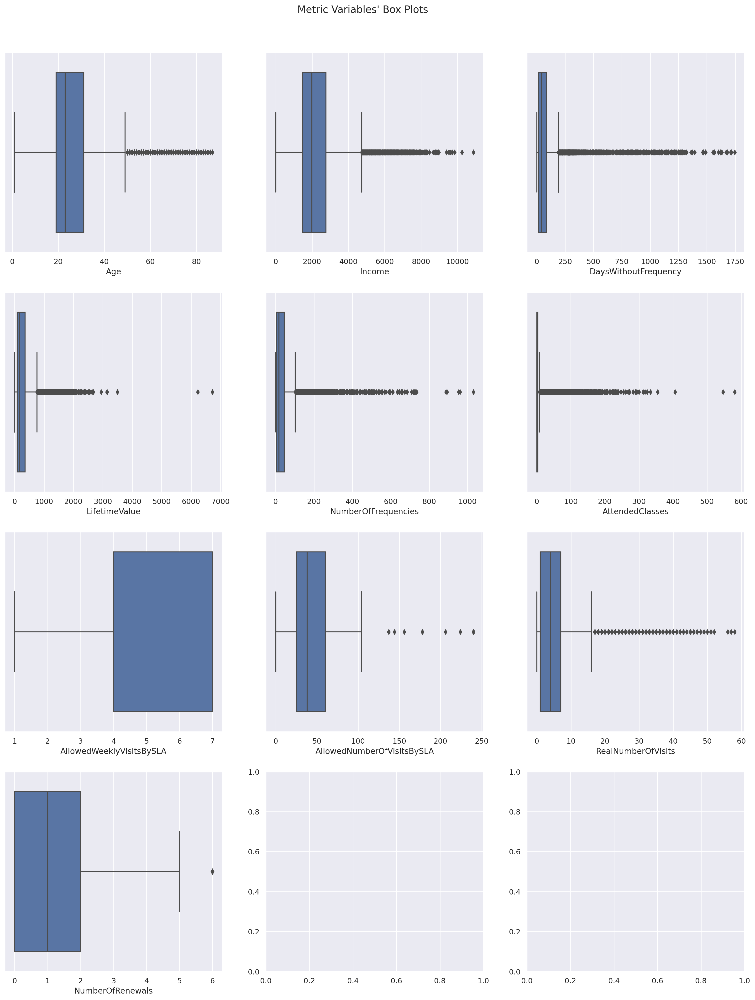

In [ ]:
num_rows = 4
num_cols = math.ceil(len(metric_features) / num_rows)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 25))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data_pp2[feat], ax=ax)


title = "Metric Variables' Box Plots"
plt.suptitle(title, fontsize=15, y=0.92)

plt.show()

In [ ]:
# Remove outliers manually
filters1 = (
    (data_pp2['Income']<=8500)
    &
    (data_pp2['DaysWithoutFrequency'] <= 1095)  # assumed 3 years as limit
    &
    (data_pp2['LifetimeValue'] <= 2800)
    &
    (data_pp2['NumberOfFrequencies'] <= 800)
    &
    (data_pp2['AttendedClasses'] <= 250)
    &
    (data_pp2['RealNumberOfVisits'] <= 60)
    &
    (data_pp2['AllowedNumberOfVisitsBySLA'] <= 125)
    &
    (data_pp2['NumberOfRenewals'] <= 6))

data_clean = data_pp2[filters1]

print('Percentage of data kept after removing outliers:', np.round(data_clean.shape[0] / data_pp2.shape[0], 4))

Percentage of data kept after removing outliers: 0.9899


Text(0.5, 0.92, "Metric Variables' Box Plots")

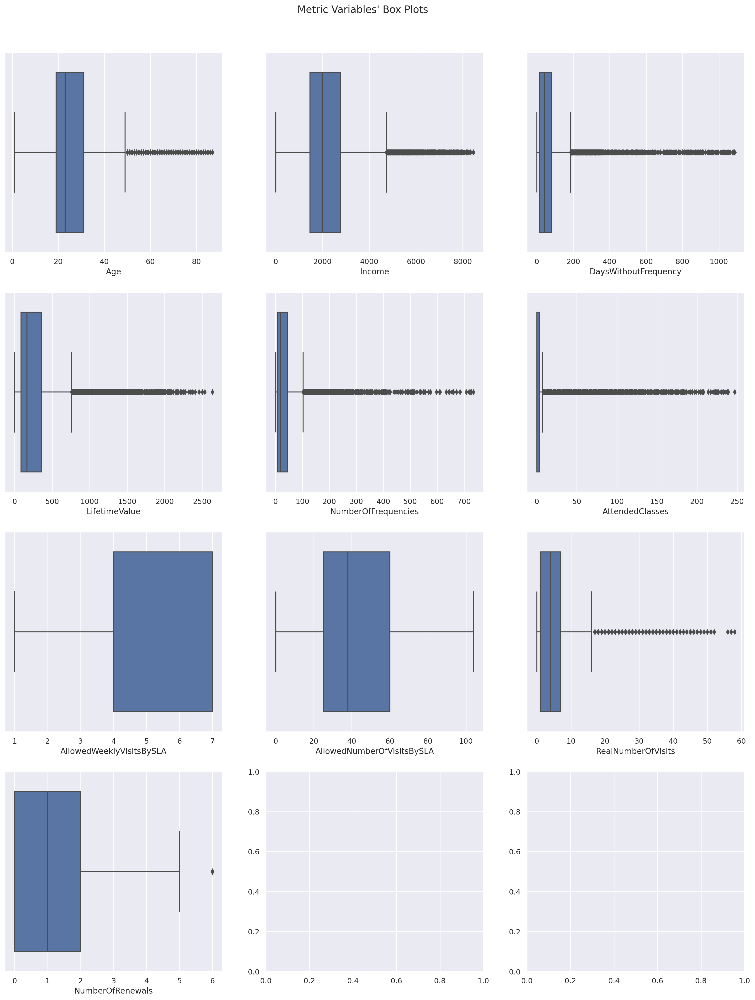

In [ ]:
# Visualization for new boxplots with new outliers thresholds
num_rows = 4
num_cols = math.ceil(len(metric_features) / num_rows)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 25))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data_clean[feat], ax=ax)

title = "Metric Variables' Box Plots"
plt.suptitle(title, fontsize=15, y=0.92)

In [ ]:
# Conclusion data
initial_nr = data_pp.shape[0]
final_nr = data_clean.shape[0]
print(f'Percentage of data removed after Missing Values and Outlier Treatment was {round(((initial_nr - final_nr)/initial_nr * 100), 1)}%')

Percentage of data removed after Missing Values and Outlier Treatment was 2.7%


In [ ]:
data_pp = data_clean.copy()

### **Feature Engineering**

In [ ]:
# Create feature that shows last active period (semester) according to DateLastVisit

#year_df = data_pp['DateLastVisit'].dt.year
data_pp['LastActivePeriod'] = np.where(data_pp['DateLastVisit'].dt.month <= 6, '1st Sem', '2nd Sem')
#data_pp['LastActivePeriod'] = data_pp['LastActivePeriod'] + ' ' + year_df.astype(str)

data_pp.insert(5, 'LastActivePeriod', data_pp.pop('LastActivePeriod'))

# Update Non-metric features list
non_metric_features.append('LastActivePeriod')

data_pp.head(3)

,Age,Male,Income,EnrollmentStart,DateLastVisit,LastActivePeriod,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,60,0,5500.0,2019-09-03,2019-10-30,2nd Sem,1,89.35,0,0.0,...,0.0,0.0,0.0,9,7,3,6,2,0,0
1,29,0,2630.0,2014-08-12,2015-07-16,2nd Sem,60,479.20,0,0.0,...,0.0,0.0,1.0,23,1,2,17,1,2,1
2,23,1,1980.0,2017-05-02,2017-05-25,1st Sem,7,37.60,0,0.0,...,0.0,0.0,0.0,6,0,7,30,6,0,1


In [ ]:
# Change binaries to int64
data_pp[binary_features] = data_pp[binary_features].astype('int64')

### **Transformations**

#### **Scaling**

For Metric Features

Normalization
- MinMax Scaler

Standardization
- Standard Scaler
- it assumes that your data is normally distributed (bell shaped)

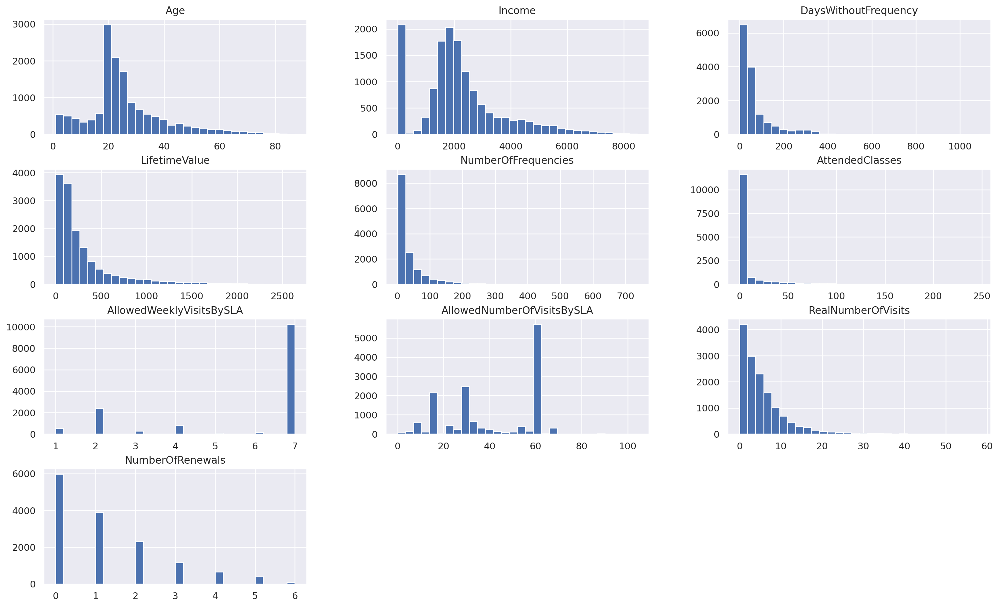

In [ ]:
# Check metric_features distributions
data_pp[metric_features].hist(bins=30, figsize=(20, 12))
plt.show()

**Log Transformer**
Helps with skewness
No predetermined range for scaled data
Useful only on non-zero, non-negative data


**Min-Max Scaler**
Rescales to predetermined range [0–1]
Doesn’t change distribution’s center (doesn’t correct skewness)
Sensitive to outliers


**Max Abs Scaler**
Rescales to predetermined range [-1–1]
Doesn’t change distribution’s center
Sensitive to outliers


**Standard Scaler**
Shifts distribution’s mean to 0 & unit variance
No predetermined range
Best to use on data that is approximately normally distributed


**Robust Scaler**
0 mean & unit variance
Use of quartile ranges makes this less sensitive to (a few) outliers
No predetermined range


**Power Transformer**
Helps correct skewness
0 mean & unit variance
No predetermined range
Yeo-Johnson or Box-Cox
Box-Cox can only be used on non-negative data

(data from https://medium.com/@sjacks/feature-transformation-21282d1a3215)

*Conclusion*
***Cant use Log nor BoxCox since we have zeros, so must try with MinMax and Standard***

In [ ]:
# Try with MinMax Scaler
data_minmax = data_pp.copy()

In [ ]:
# Use MinMaxScaler to scale the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(data_minmax[metric_features])
data_minmax[metric_features] = scaled_feat
data_minmax.head()

,Age,Male,Income,EnrollmentStart,DateLastVisit,LastActivePeriod,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,0.686047,0,0.650118,2019-09-03,2019-10-30,2nd Sem,0.000921,0.033886,0,0,...,0,0,0,0.010899,0.028340,0.333333,0.057692,0.034483,0.000000,0
1,0.325581,0,0.310875,2014-08-12,2015-07-16,2nd Sem,0.055249,0.181738,0,0,...,0,0,1,0.029973,0.004049,0.166667,0.163462,0.017241,0.333333,1
2,0.255814,1,0.234043,2017-05-02,2017-05-25,1st Sem,0.006446,0.014260,0,0,...,0,0,0,0.006812,0.000000,1.000000,0.288462,0.103448,0.000000,1
3,0.093023,1,0.000000,2018-09-05,2019-01-21,1st Sem,0.020258,0.058936,0,0,...,0,0,0,0.025886,0.008097,0.166667,0.163462,0.051724,0.000000,1
4,0.395349,1,0.510638,2016-04-20,2017-11-09,2nd Sem,0.193370,0.141537,0,0,...,0,0,0,0.054496,0.000000,1.000000,0.576923,0.000000,0.500000,1


In [ ]:
# Try with Standard Scaler
data_standard = data_pp.copy()

In [ ]:
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(data_standard[metric_features])
data_standard[metric_features] = scaled_feat
data_standard.head()

,Age,Male,Income,EnrollmentStart,DateLastVisit,LastActivePeriod,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,...,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
0,2.424865,0,2.152926,2019-09-03,2019-10-30,2nd Sem,-0.643635,-0.599066,0,0,...,0,0,0,-0.495118,-0.099276,-1.260716,-1.793459,-0.536331,-0.869329,0
1,0.216046,0,0.277325,2014-08-12,2015-07-16,2nd Sem,-0.133905,0.522920,0,0,...,0,0,1,-0.265049,-0.328001,-1.729636,-1.225600,-0.701387,0.605300,1
2,-0.211467,1,-0.147462,2017-05-02,2017-05-25,1st Sem,-0.591798,-0.748002,0,0,...,0,0,0,-0.544419,-0.366122,0.614966,-0.554493,0.123892,-0.869329,1
3,-1.208998,1,-1.441431,2018-09-05,2019-01-21,1st Sem,-0.462206,-0.408974,0,0,...,0,0,0,-0.314349,-0.289881,-1.729636,-1.225600,-0.371275,-0.869329,1
4,0.643559,1,1.381773,2016-04-20,2017-11-09,2nd Sem,1.162020,0.217853,0,0,...,0,0,0,0.030755,-0.366122,0.614966,0.994216,-0.866443,1.342614,1


In [ ]:
# Select which one (MinMax currently)
#data_pp = data_minmax.copy()
data_pp = data_standard.copy()

# Save dataframe for pca (cant use minmax)
data_pca = data_standard.copy()

#### **One-Hot Encoding**

For categorical features

In [ ]:
data_ohc = data_pp.copy()

In [ ]:
# Get all non binary features from non_metric_features (since binary dont need to be encoded)
ohc_columns = [feature for feature in non_metric_features if feature not in binary_features]

In [ ]:
ohc = OneHotEncoder(sparse=False, drop="first")
ohc_feat = ohc.fit_transform(data_ohc[ohc_columns])
ohc_feat_names = ohc.get_feature_names_out()
ohc_df = pd.DataFrame(ohc_feat, index=data_ohc.index, columns=ohc_feat_names)
ohc_df

,LastActivePeriod_2nd Sem
ID,
0,1.0
1,1.0
2,0.0
3,0.0
4,1.0
...,...
14937,1.0
14938,0.0
14939,0.0


In [ ]:
data_pp_ohc = pd.concat([data_ohc.drop(columns=ohc_columns), ohc_df], axis=1)
data_pp_ohc.head()

,Age,Male,Income,EnrollmentStart,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,...,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout,LastActivePeriod_2nd Sem
ID,,,,,,,,,,,,,,,,,,,,,
0,2.424865,0,2.152926,2019-09-03,2019-10-30,-0.643635,-0.599066,0,0,0,...,0,0,-0.495118,-0.099276,-1.260716,-1.793459,-0.536331,-0.869329,0,1.0
1,0.216046,0,0.277325,2014-08-12,2015-07-16,-0.133905,0.522920,0,0,0,...,0,1,-0.265049,-0.328001,-1.729636,-1.225600,-0.701387,0.605300,1,1.0
2,-0.211467,1,-0.147462,2017-05-02,2017-05-25,-0.591798,-0.748002,0,0,0,...,0,0,-0.544419,-0.366122,0.614966,-0.554493,0.123892,-0.869329,1,0.0
3,-1.208998,1,-1.441431,2018-09-05,2019-01-21,-0.462206,-0.408974,0,0,0,...,0,0,-0.314349,-0.289881,-1.729636,-1.225600,-0.371275,-0.869329,1,0.0
4,0.643559,1,1.381773,2016-04-20,2017-11-09,1.162020,0.217853,0,0,0,...,0,0,0.030755,-0.366122,0.614966,0.994216,-0.866443,1.342614,1,1.0


In [ ]:
data_pp_ohc.rename(columns={'LastActivePeriod_2nd Sem': 'LastActivePeriod_2nd_Sem'}, inplace=True)

# Update non metric features list
non_metric_features.remove('LastActivePeriod')
non_metric_features.append('LastActivePeriod_2nd_Sem')
binary_features.append('LastActivePeriod_2nd_Sem')

# Change to int64 instead of float
data_pp_ohc['LastActivePeriod_2nd_Sem'] = data_pp_ohc['LastActivePeriod_2nd_Sem'].astype('int64')

In [ ]:
data_pp = data_pp_ohc.copy()

### **Feature Selection**

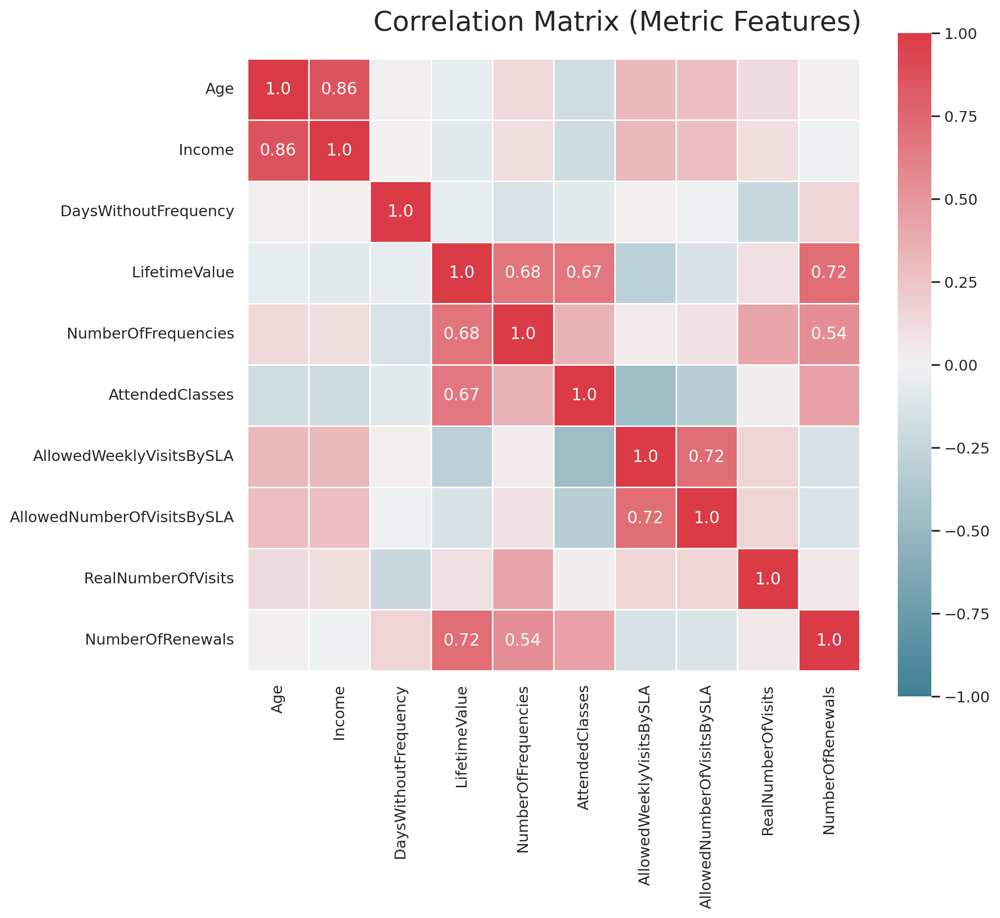

In [ ]:
# For Metric Features
fig = plt.figure(figsize=(10, 8))
corr = np.round(data_pp[metric_features].corr(method="pearson"), decimals=2)

mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True),
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix (Metric Features)", fontsize=20)

plt.show()

**Conclusions**

*   Most correlated features are: 'LifeTimeValue' and 'NumberOfFrequencies'
*   Least correlated features are: 'DaysWithoutFrequency', 'RealNumberOfVisits' and 'NumberOfReferences'



In [ ]:
# Drop 'Income' and 'LifetimeValue' after reviewing their correlation values
data_pp.drop('Income', axis=1, inplace=True)
data_pp.drop('LifetimeValue', axis=1, inplace=True)

metric_features.remove('Income')
metric_features.remove('LifetimeValue')

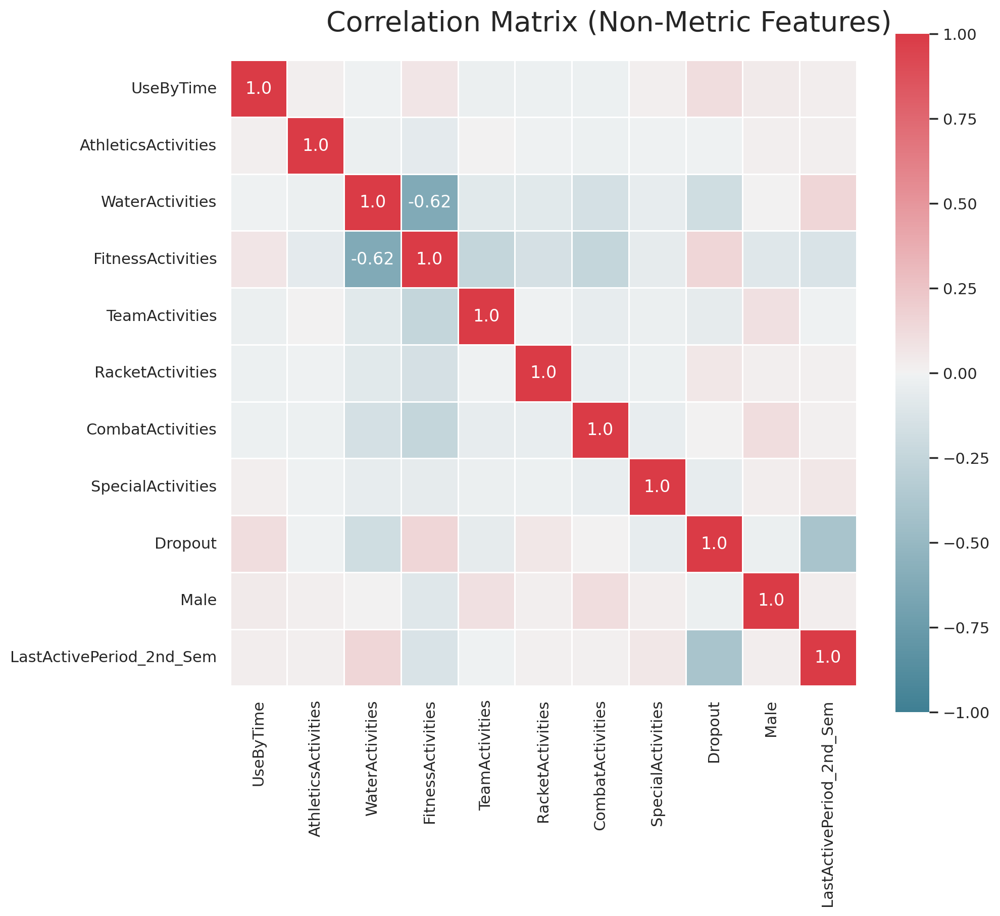

In [ ]:
# For Non-metric features
fig = plt.figure(figsize=(10, 8))
corr = np.round(data_pp[non_metric_features].corr(method="pearson"), decimals=2)

mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True),
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix (Non-Metric Features)", fontsize=20)

plt.show()

**Conclusions**

*   No features present very high or low correlations


In [ ]:
data = data_pp.copy()

### **PCA**
(commented since we ended up not using)

**data_pca** is created in scaling (uses standard scaling)

In [ ]:
'''data_pca = data.copy()'''

'data_pca = data.copy()'

In [ ]:
'''pca = PCA()
pca_features = pca.fit_transform(data_pca[metric_features])
pca_features'''

'pca = PCA()\npca_features = pca.fit_transform(data_pca[metric_features])\npca_features'

In [ ]:
'''# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1))'''

'# Output PCA table\npd.DataFrame(\n    {"Eigenvalue": pca.explained_variance_,\n     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),\n     "Proportion": pca.explained_variance_ratio_,\n     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},\n    index=range(1, pca.n_components_ + 1))'

In [ ]:
'''# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()'''

'# figure and axes\nfig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))\n\n# draw plots\nax1.plot(pca.explained_variance_, marker=".", markersize=12)\nax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")\nax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")\n\n# customizations\nax2.legend()\nax1.set_title("Scree Plot", fontsize=14)\nax2.set_title("Variance Explained", fontsize=14)\nax1.set_ylabel("Eigenvalue")\nax2.set_ylabel("Proportion")\nax1.set_xlabel("Components")\nax2.set_xlabel("Components")\nax1.set_xticks(range(0, pca.n_components_, 2))\nax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))\nax2.set_xticks(range(0, pca.n_components_, 2))\nax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))\n\nplt.show()'

In [ ]:
'''# Perform PCA and retain a specific number of principal components
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(data_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_data = pd.DataFrame(pca_feat, index=data_pca.index, columns=pca_feat_names)  # remember index=data_pca.index
pca_data'''

'# Perform PCA and retain a specific number of principal components\npca = PCA(n_components=3)\npca_feat = pca.fit_transform(data_pca[metric_features])\npca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]\npca_data = pd.DataFrame(pca_feat, index=data_pca.index, columns=pca_feat_names)  # remember index=data_pca.index\npca_data'

In [ ]:
'''#join the pcas with the dataset
data_pca = pd.concat([data_pca, pca_data], axis=1)
data_pca.head()'''

'#join the pcas with the dataset\ndata_pca = pd.concat([data_pca, pca_data], axis=1)\ndata_pca.head()'

In [ ]:
'''#how to interpret pca #only metric features because non metric one-hot encoding
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = data_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)'''

"#how to interpret pca #only metric features because non metric one-hot encoding\ndef _color_red_or_green(val):\n    if val < -0.45:\n        color = 'background-color: red'\n    elif val > 0.45:\n        color = 'background-color: green'\n    else:\n        color = ''\n    return color\n\n# Interpreting each Principal Component\nloadings = data_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]\nloadings.style.applymap(_color_red_or_green)"

In [ ]:
#nao faz sentido prosseguir c pca porque nao temos demasiadas features e os pca tem pouca interpretabilidade (nao sabemos o que é o pc0 pc1 e pc2)

## **Clustering**

#### **Segmentation**

In [ ]:
data.head()

,Age,Male,EnrollmentStart,DateLastVisit,DaysWithoutFrequency,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,Dropout,LastActivePeriod_2nd_Sem
ID,,,,,,,,,,,,,,,,,,,,,
0,2.424865,0,2019-09-03,2019-10-30,-0.643635,0,0,0,1,0,...,0,0,-0.495118,-0.099276,-1.260716,-1.793459,-0.536331,-0.869329,0,1
1,0.216046,0,2014-08-12,2015-07-16,-0.133905,0,0,0,0,0,...,0,1,-0.265049,-0.328001,-1.729636,-1.225600,-0.701387,0.605300,1,1
2,-0.211467,1,2017-05-02,2017-05-25,-0.591798,0,0,0,1,0,...,0,0,-0.544419,-0.366122,0.614966,-0.554493,0.123892,-0.869329,1,0
3,-1.208998,1,2018-09-05,2019-01-21,-0.462206,0,0,0,0,1,...,0,0,-0.314349,-0.289881,-1.729636,-1.225600,-0.371275,-0.869329,1,0
4,0.643559,1,2016-04-20,2017-11-09,1.162020,0,0,0,1,0,...,0,0,0.030755,-0.366122,0.614966,0.994216,-0.866443,1.342614,1,1


In [ ]:
data = data.drop(columns=["EnrollmentStart","DateLastVisit"], axis = 1) #clusterizing with data was not possible

In [ ]:
# Split variables into perspectives (example, requires critical thinking and domain knowledge)
engagement_features = [
    'AttendedClasses', 'RealNumberOfVisits', 'NumberOfFrequencies', 'DaysWithoutFrequency'
]

service_features = [
    'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'NumberOfRenewals'
]

df_engagement = data[engagement_features].copy()
df_service = data[service_features].copy()

define silhouette

In [ ]:
def silhouette(df, labels): #métrica de avaliação
    return silhouette_score(df, labels, metric='euclidean')

define r squared

In [ ]:
def get_ss(df): #métrica de avaliação
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # Return the sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

### **Clustering on Engagement Segment**

In [ ]:
# Test on engagement segment
df = df_engagement.copy()

#### **Hierarchical**

In [ ]:
# ------------------------------------------------------------------
def get_r2_scores(df, clusterer, min_k=1, max_k=8):
    r2_clust = {}
    # Iterate over number of clusters
    for n in range(min_k, max_k+1):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)

    return r2_clust

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [ ]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000
2,0.104166,0.077124,0.001125,0.243573
3,0.236203,0.117495,0.005641,0.387664
4,0.345526,0.123752,0.006848,0.531368
5,0.478163,0.251029,0.007597,0.588339
6,0.489817,0.251761,0.011043,0.643672
7,0.592150,0.253444,0.012819,0.685102
8,0.594583,0.254323,0.013489,0.716746


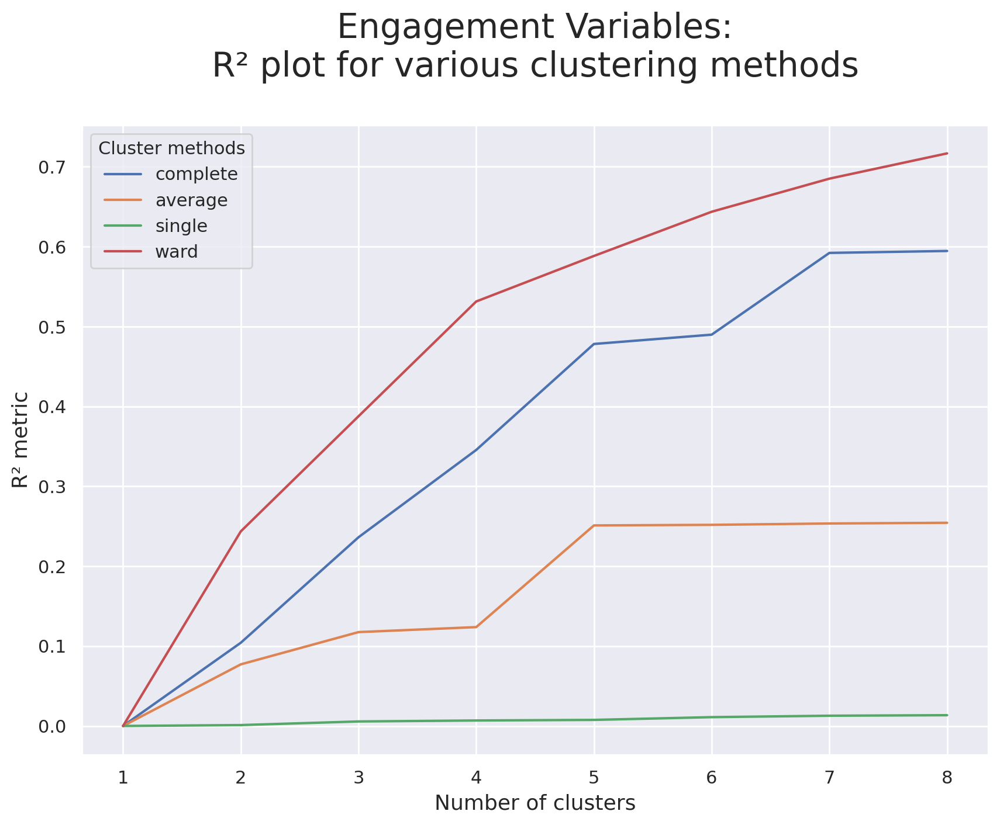

In [ ]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Engagement Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

**Conclusion**
- ward seems the best

In [ ]:
# create the counts of samples under each node (number of points being merged)
def function_linkage(linkage,distance,hclust):
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    for i, merge in enumerate(hclust.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)
    sns.set()
    fig = plt.figure(figsize=(11,5))
    y_threshold = 79
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{distance.title()} Distance', fontsize=13)
    plt.show()

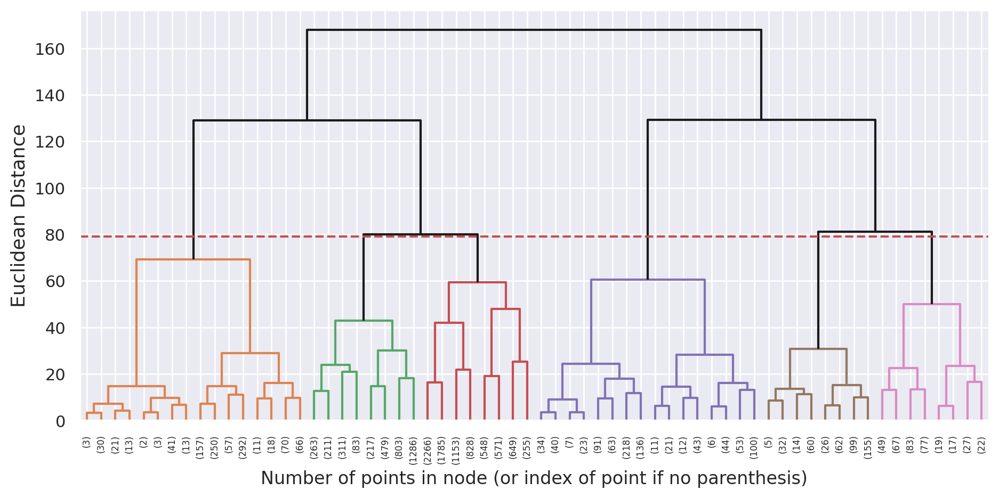

In [ ]:
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df)

function_linkage(linkage,distance,hclust)

In [ ]:
# We defined 6 clusters as being the optimal nr
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=6)
hc_labels = hclust.fit_predict(df)

In [ ]:
# Characterizing the 6 clusters
df_concat = pd.concat((df, pd.Series(hc_labels, name='labels', index = df.index)), axis=1)
df_concat.groupby('labels').mean()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency
labels,,,,
0,-0.230788,-0.481628,-0.333467,2.742478
1,-0.159129,-0.498320,-0.241475,-0.148196
2,3.244205,0.195257,1.151040,-0.389297
3,-0.272879,1.663344,4.316718,-0.483744
4,-0.310919,3.324077,0.622325,-0.563953
5,-0.318505,0.612055,-0.159942,-0.245390


In [ ]:
print(silhouette(df,hc_labels))
print(r2(df,hc_labels))

0.2893331208648961
0.6436723987359616


#### **Kmeans**

In [ ]:
range_clusters = range(1, 11)

In [ ]:
inertia = []
for n_clus in range_clusters:
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df)
    inertia.append(kmclust.inertia_)

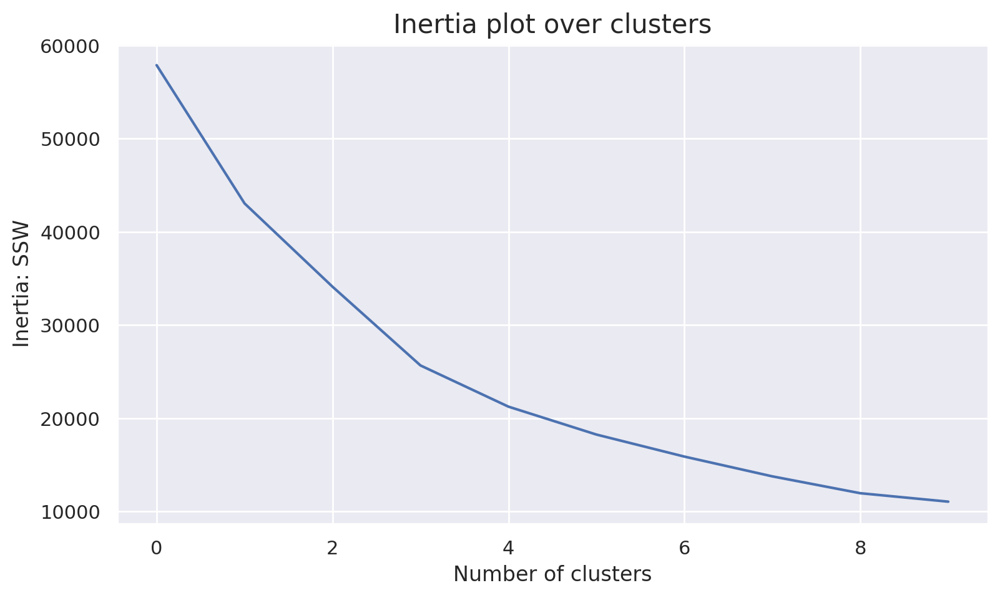

In [ ]:
# Inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSW")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.5430302967171067
For n_clusters = 3, the average silhouette_score is : 0.5259366323036995
For n_clusters = 4, the average silhouette_score is : 0.5146645930466669
For n_clusters = 5, the average silhouette_score is : 0.4564841725319593
For n_clusters = 6, the average silhouette_score is : 0.42301042043431675
For n_clusters = 7, the average silhouette_score is : 0.436130530188867
For n_clusters = 8, the average silhouette_score is : 0.3789925143661989
For n_clusters = 9, the average silhouette_score is : 0.3798920270718259
For n_clusters = 10, the average silhouette_score is : 0.30431623039922817


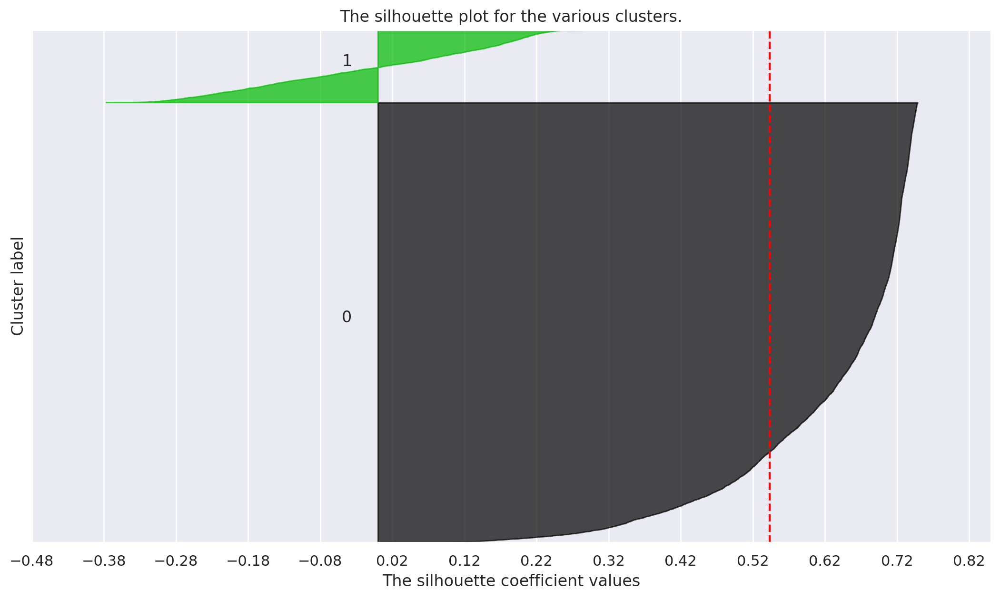

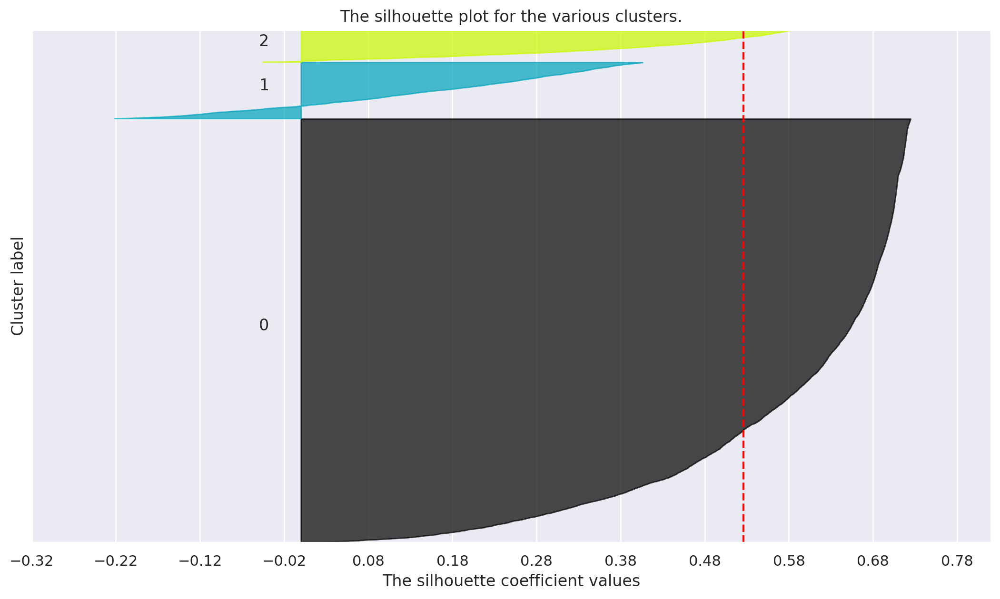

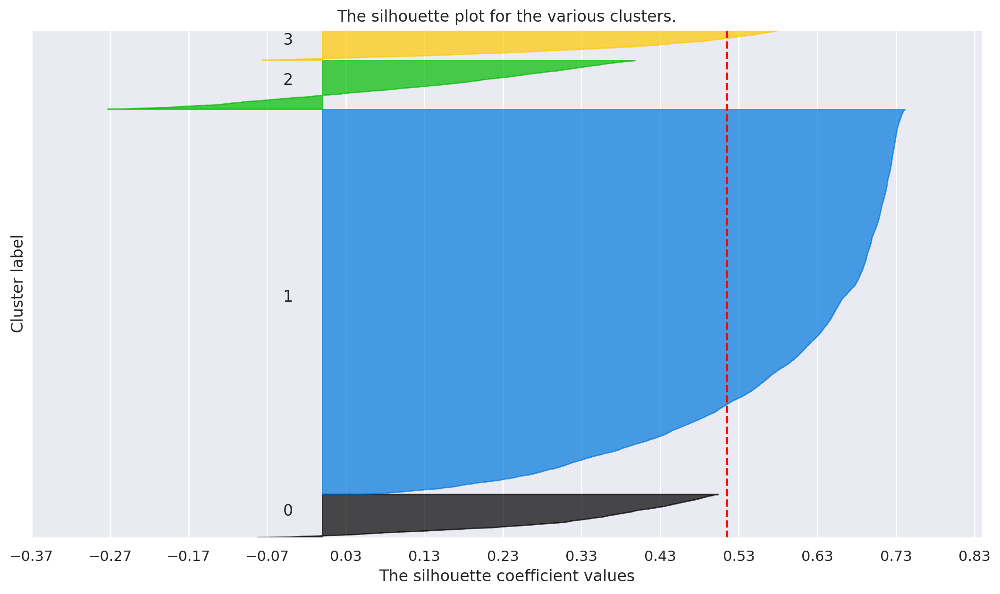

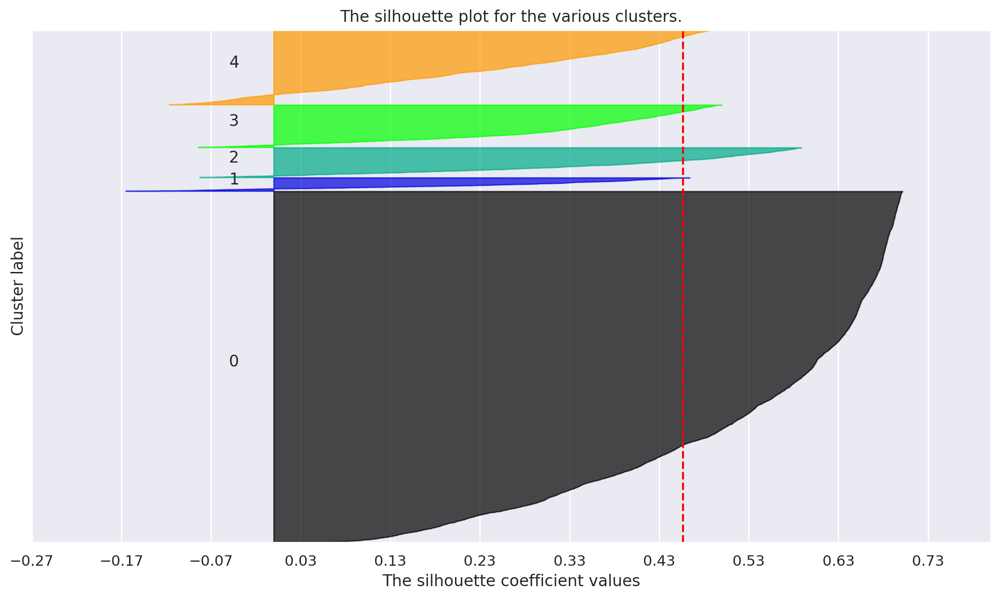

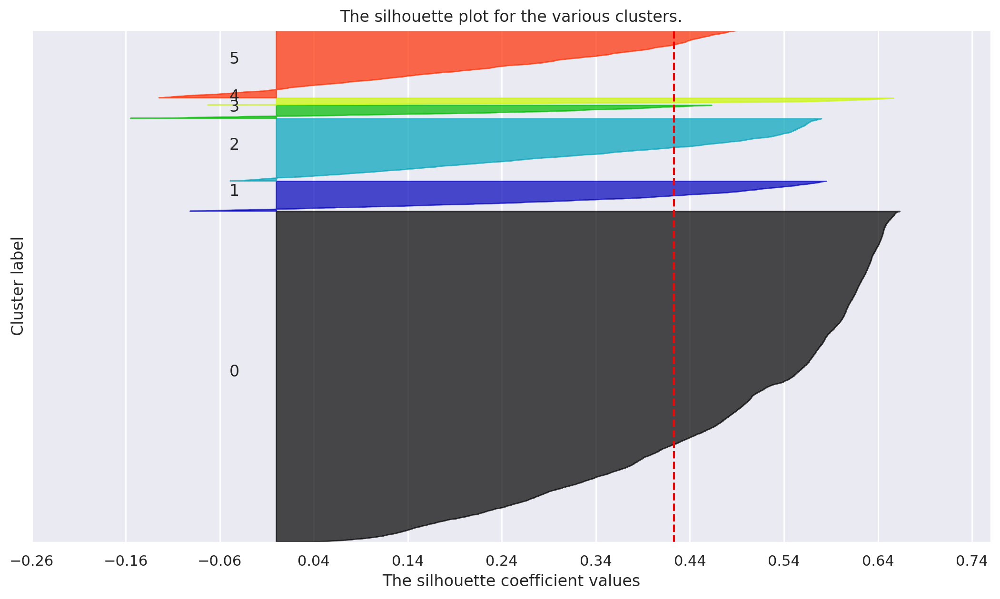

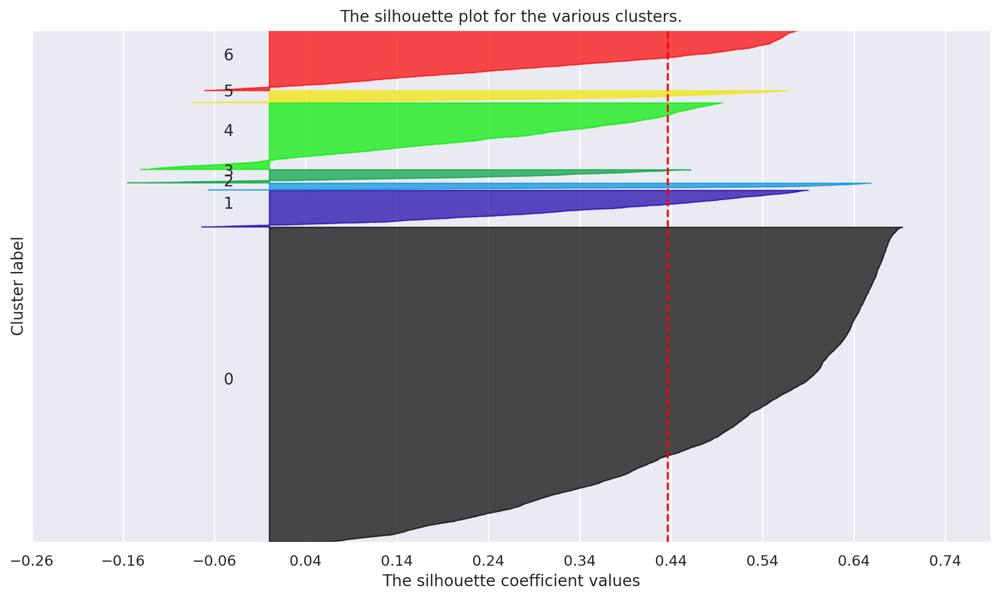

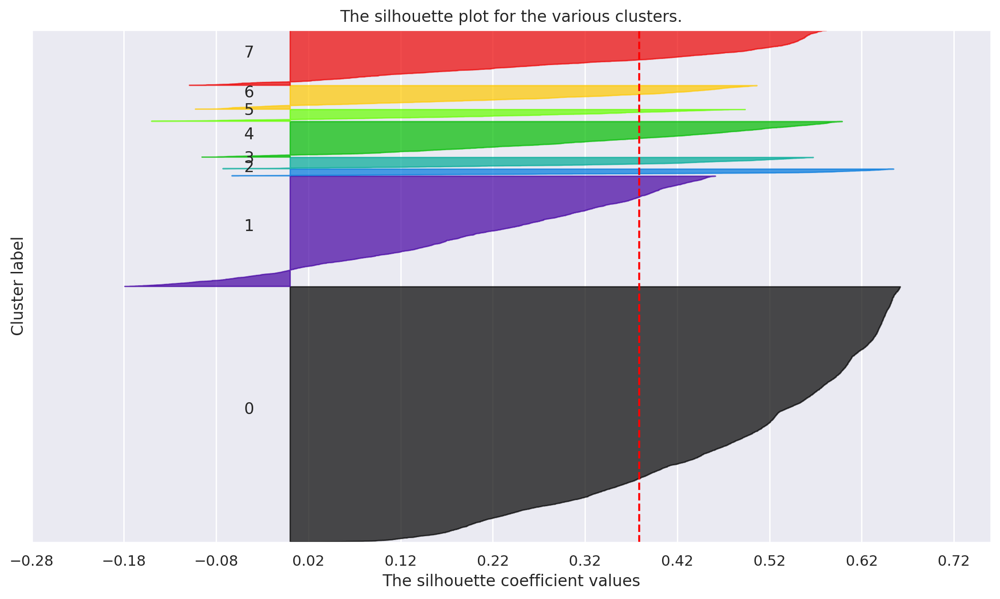

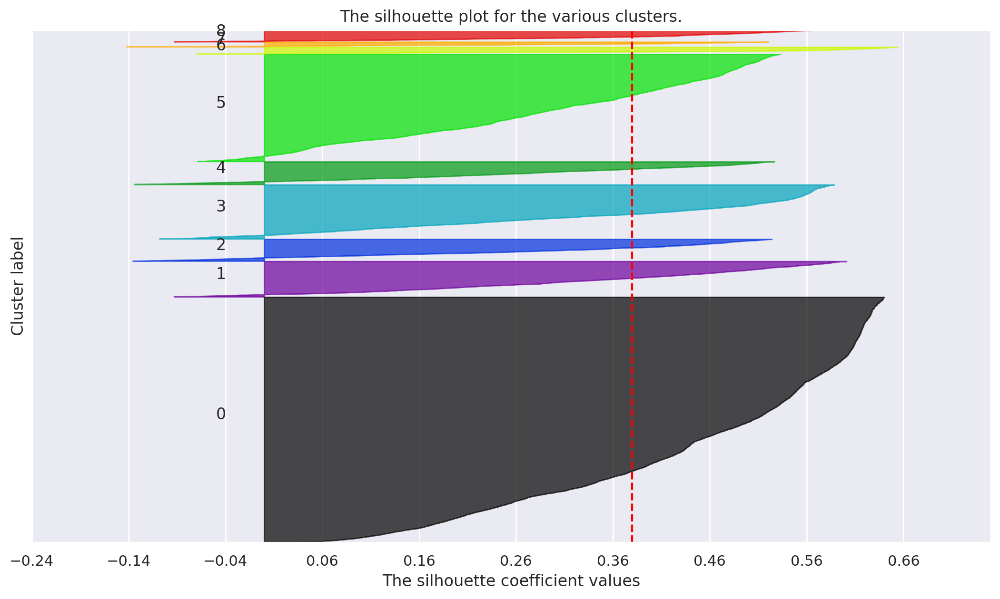

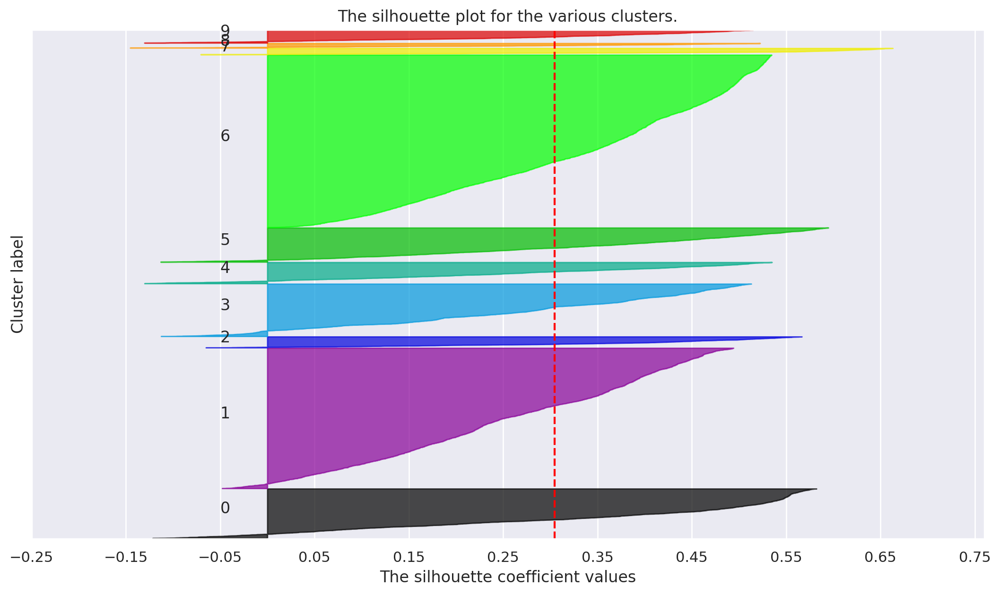

In [ ]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue

    # Create a figure
    fig = plt.figure(figsize=(13, 7))
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df)

    silhouette_avg = silhouette_score(df, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")

    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])

    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

**Conclusion**
- Optimal 3/4 number of clusters

In [ ]:
'''# final cluster solution (test with 3)
number_clusters = 3
kmclust3 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels3 = kmclust3.fit_predict(df)
km_labels3'''

"# final cluster solution (test with 3)\nnumber_clusters = 3\nkmclust3 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)\nkm_labels3 = kmclust3.fit_predict(df)\nkm_labels3"

In [ ]:
'''# Characterizing the final clusters
df_concat3 = pd.concat((df, pd.Series(km_labels3, name='labels',index = df.index)), axis=1)
df_concat3.groupby('labels').mean()'''

"# Characterizing the final clusters\ndf_concat3 = pd.concat((df, pd.Series(km_labels3, name='labels',index = df.index)), axis=1)\ndf_concat3.groupby('labels').mean()"

In [ ]:
'''print(silhouette(df,km_labels3))
print(r2(df,km_labels3))'''

'print(silhouette(df,km_labels3))\nprint(r2(df,km_labels3))'

In [ ]:
# final cluster solution (after test, 4 is better)
number_clusters = 4
kmclust4 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels4 = kmclust4.fit_predict(df)
km_labels4

array([1, 1, 1, ..., 1, 3, 2], dtype=int32)

In [ ]:
# Characterizing the final clusters
df_concat4 = pd.concat((df, pd.Series(km_labels4, name='labels',index = df.index)), axis=1)
df_concat4.groupby('labels').mean()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency
labels,,,,
0,-0.230843,-0.429956,-0.320952,2.565363
1,-0.203462,-0.223496,-0.271193,-0.203272
2,-0.271930,2.073352,1.680428,-0.449510
3,3.365961,0.117565,1.205036,-0.350645


In [ ]:
print(silhouette(df,km_labels4))
print(r2(df,km_labels4))

0.5146645930466669
0.556427758701288


#### **Density-Based**

##### **Mean Shift**

In [ ]:
bandwidth = estimate_bandwidth(df, quantile=0.3, random_state=1, n_jobs=-1)
bandwidth

1.5226566437349525

In [ ]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(df)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 22


In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(ms_labels, index=df.index, name="ms_labels")], axis=1)
df_concat.head()
df_concat.groupby('ms_labels').mean()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency
ms_labels,,,,
0,-0.130490,-0.109092,-0.169856,-0.067316
1,-0.116439,-0.455759,-0.279613,5.663361
2,6.237428,0.715771,2.445841,-0.508643
3,-0.268244,0.926865,6.182223,-0.429983
4,-0.325759,3.143440,5.946340,-0.564355
5,-0.213639,4.398834,10.410169,-0.529594
6,-0.349349,4.296499,4.793847,-0.597327
7,-0.251760,5.859577,8.621380,-0.641475
8,-0.180283,6.189688,3.863874,-0.504323


In [ ]:
print(silhouette(df,ms_labels))
print(r2(df,ms_labels))

0.5432106429082137
0.5347030926515077


##### **DBSCAN**

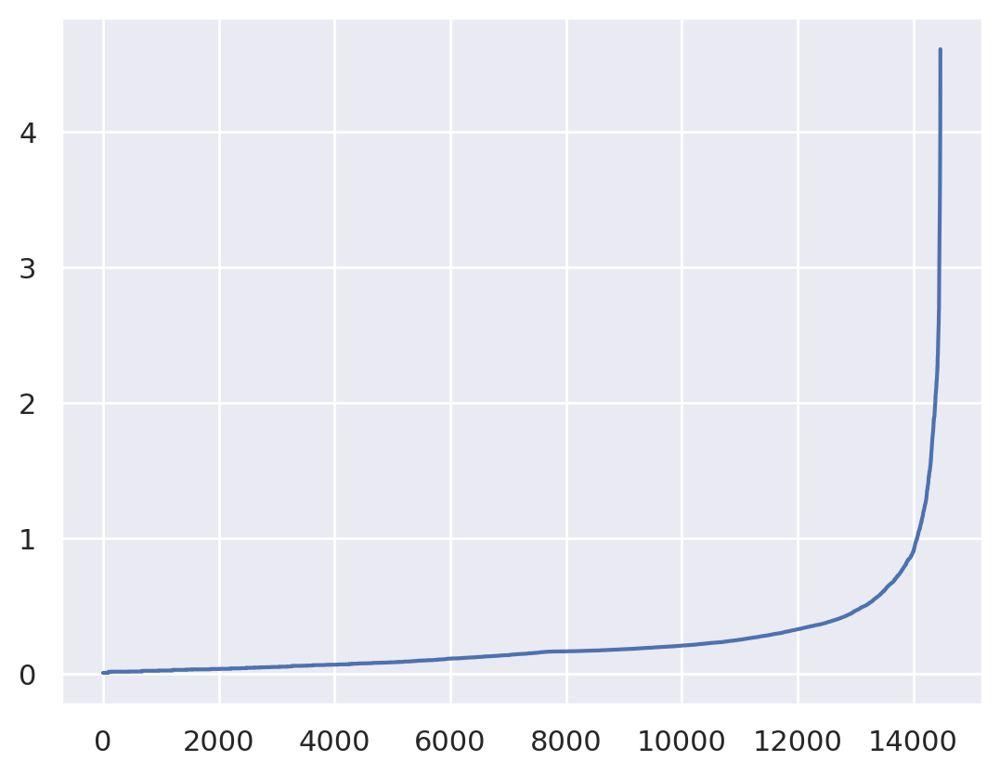

In [ ]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df)
distances, _ = neigh.kneighbors(df)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

**Conclusion**
- best value of ε seems to be around 1.0

In [ ]:
# Perform DBSCAN clustering (mudei de 1.0 dps de meter minmax)
dbscan = DBSCAN(eps=1.0, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.head()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,dbscan_labels
ID,,,,,
0,-0.099276,-0.536331,-0.495118,-0.643635,0
1,-0.328001,-0.701387,-0.265049,-0.133905,0
2,-0.366122,0.123892,-0.544419,-0.591798,0
3,-0.289881,-0.371275,-0.314349,-0.462206,0
4,-0.366122,-0.866443,0.030755,1.162020,0


In [ ]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,dbscan_labels
ID,,,,,
23,7.524902,0.949170,2.758720,-0.600438,-1
38,4.398989,3.259950,1.444038,-0.643635,-1
75,-0.366122,4.085228,6.127592,-0.401729,-1
95,-0.366122,6.726119,4.139136,-0.643635,-1
181,0.968109,1.609393,3.794032,-0.626356,-1
...,...,...,...,...,...
14492,5.390132,0.123892,4.287038,-0.539961,-1
14710,1.120592,0.288947,0.030755,7.684839,-1
14883,-0.366122,0.123892,1.000333,3.330533,-1


In [ ]:
print(silhouette(df,dbscan_labels))
print(r2(df,dbscan_labels))

0.7089780835364522
0.09315491537148646


##### **Gaussian Mixture Model**

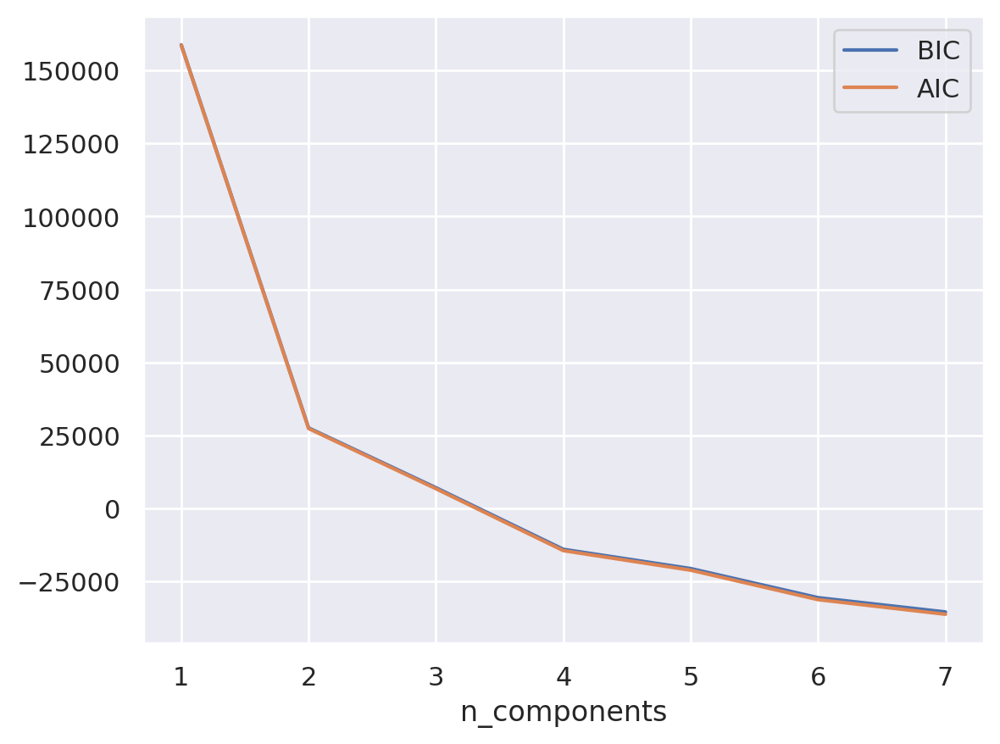

In [ ]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 8)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df)
          for n in n_components]

bic_values = [m.bic(df) for m in models]
aic_values = [m.aic(df) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

**Conclusion**
- elbow point seems to be around 3 n_components

In [ ]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df)

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)
df_concat.head()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,gmm_labels
ID,,,,,
0,-0.099276,-0.536331,-0.495118,-0.643635,2
1,-0.328001,-0.701387,-0.265049,-0.133905,1
2,-0.366122,0.123892,-0.544419,-0.591798,0
3,-0.289881,-0.371275,-0.314349,-0.462206,2
4,-0.366122,-0.866443,0.030755,1.162020,0


In [ ]:
print(silhouette(df,gmm_labels))
print(r2(df,gmm_labels))

0.13879519223717693
0.21426227267870723


### **Clustering on Service Segment**

In [ ]:
# Test on service segment
df = df_service.copy()

#### **Hierarchical**

In [ ]:
# ------------------------------------------------------------------
def get_r2_scores(df, clusterer, min_k=1, max_k=8):
    r2_clust = {}
    # Iterate over number of clusters
    for n in range(min_k, max_k+1):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)

    return r2_clust

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [ ]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000
2,0.248784,0.000840,0.000840,0.474645
3,0.253181,0.479290,0.004836,0.614059
4,0.393327,0.546351,0.005202,0.735647
5,0.687604,0.549545,0.007152,0.812431
6,0.807197,0.616198,0.007204,0.840538
7,0.819761,0.622785,0.014157,0.862822
8,0.824375,0.746462,0.018533,0.884102


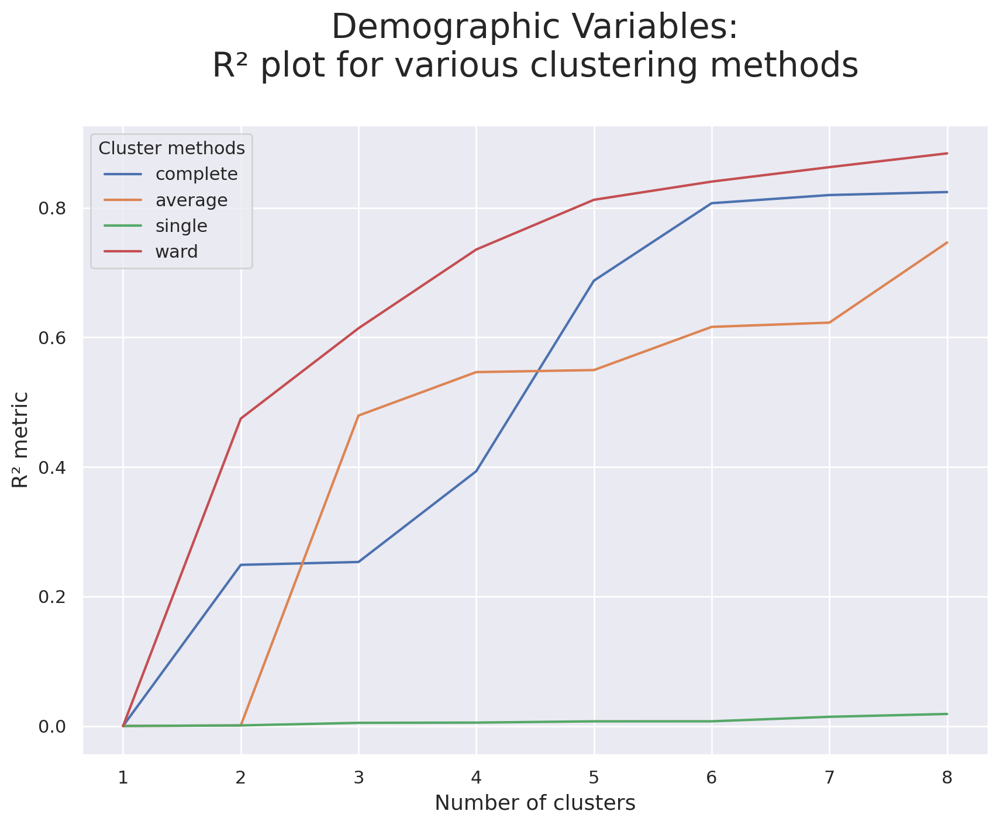

In [ ]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

**Conclusion**
- ward seems best

In [ ]:
# create the counts of samples under each node (number of points being merged)
def function_linkage(linkage,distance,hclust):
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    for i, merge in enumerate(hclust.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)
    sns.set()
    fig = plt.figure(figsize=(11,5))
    y_threshold = 79
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{distance.title()} Distance', fontsize=13)
    plt.show()

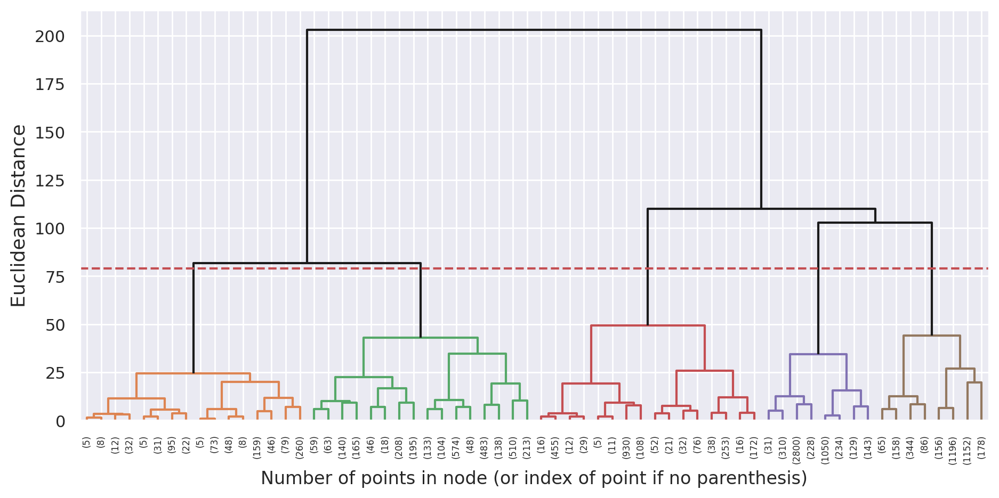

In [ ]:
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df)

function_linkage(linkage,distance,hclust)

In [ ]:
# We defined 5 clusters as being the optimal nr
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=5)
hc_labels = hclust.fit_predict(df)

In [ ]:
## Characterizing the 5 clusters
df_concat = pd.concat((df, pd.Series(hc_labels, name='labels', index = df.index)), axis=1)
df_concat.groupby('labels').mean()

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals
labels,,,
0,0.598324,0.842963,1.307835
1,0.576159,-0.632571,-0.227302
2,-1.569140,-1.096966,-0.243433
3,0.607920,0.944196,-0.636382
4,-1.562768,-1.148280,1.953722


In [ ]:
print(silhouette(df,hc_labels))
print(r2(df,hc_labels))

0.5355336737863574
0.812430873191853


#### **Kmeans**

In [ ]:
range_clusters = range(1, 11)

In [ ]:
inertia = []
for n_clus in range_clusters:
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df)
    inertia.append(kmclust.inertia_)

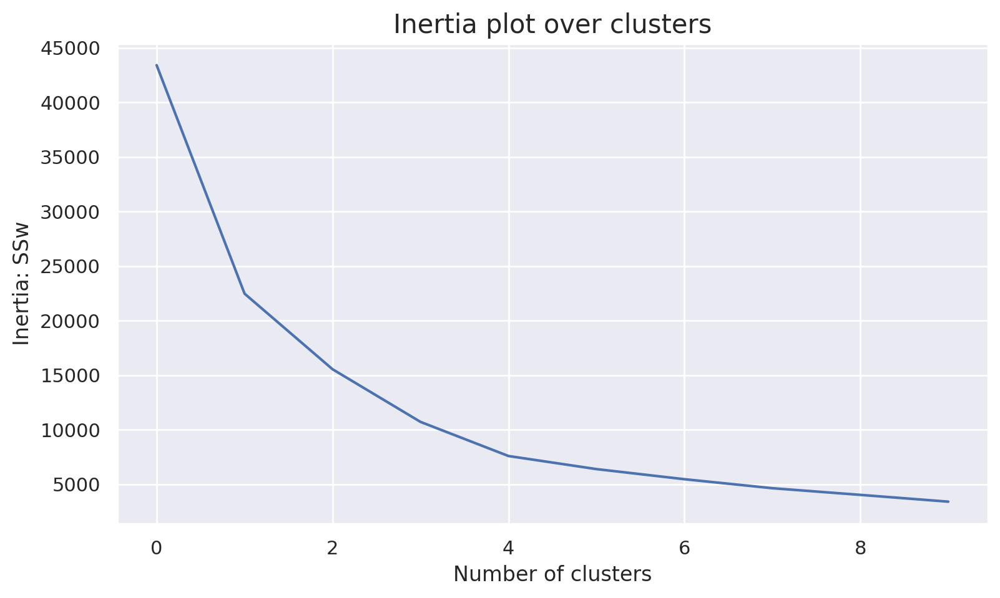

In [ ]:
# Inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.5081487061234472
For n_clusters = 3, the average silhouette_score is : 0.4652211948908961
For n_clusters = 4, the average silhouette_score is : 0.5301898851674888
For n_clusters = 5, the average silhouette_score is : 0.5500734679754216
For n_clusters = 6, the average silhouette_score is : 0.5616684782122936
For n_clusters = 7, the average silhouette_score is : 0.5483185677203193
For n_clusters = 8, the average silhouette_score is : 0.5723172011626085
For n_clusters = 9, the average silhouette_score is : 0.579816827260132
For n_clusters = 10, the average silhouette_score is : 0.6028293451946503


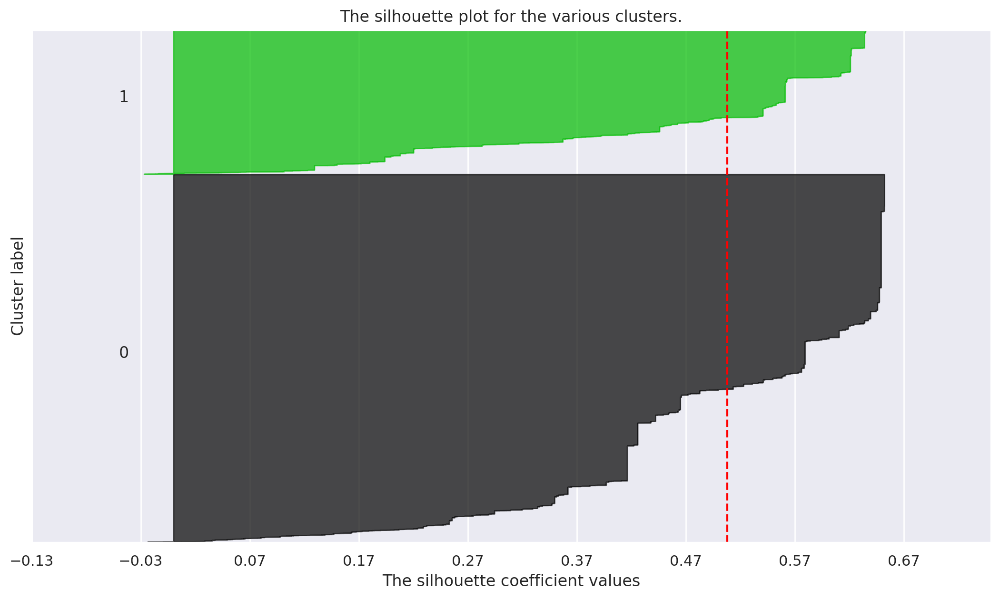

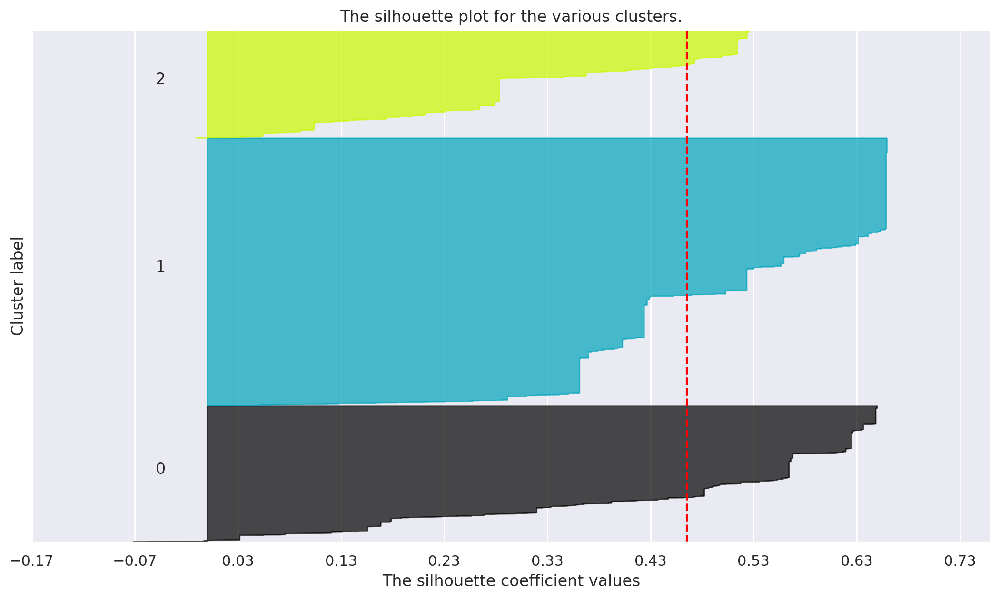

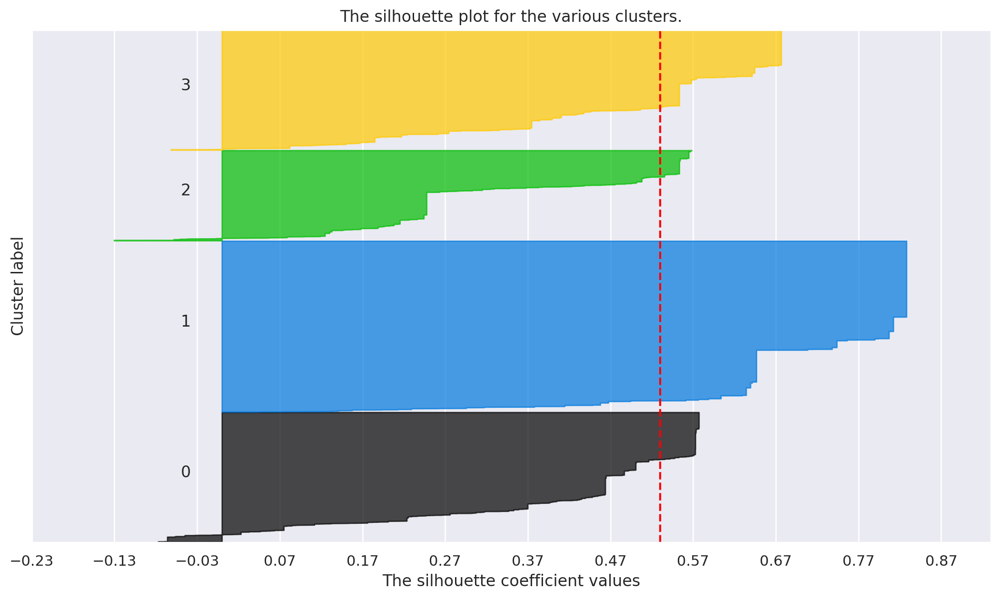

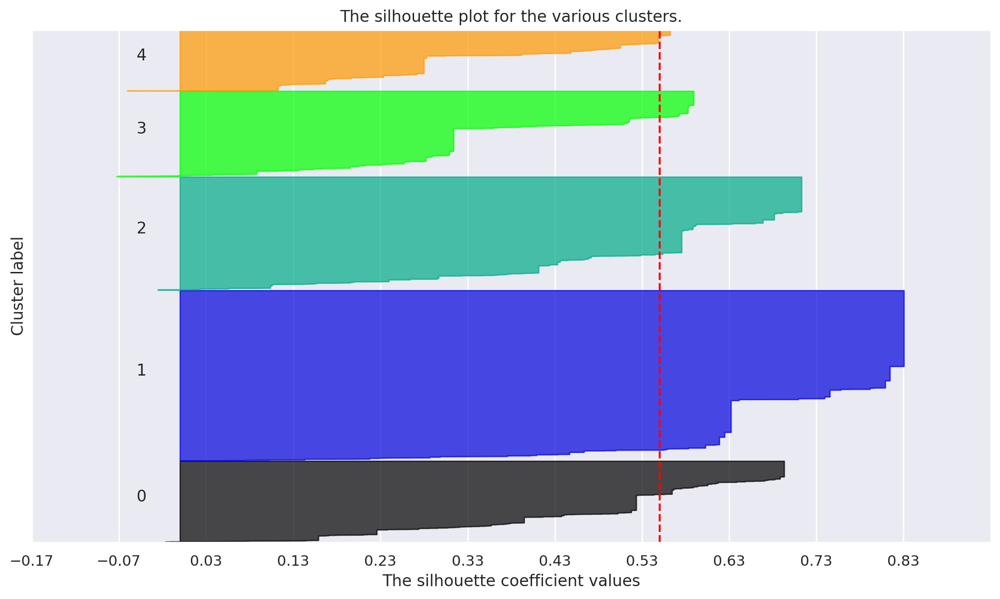

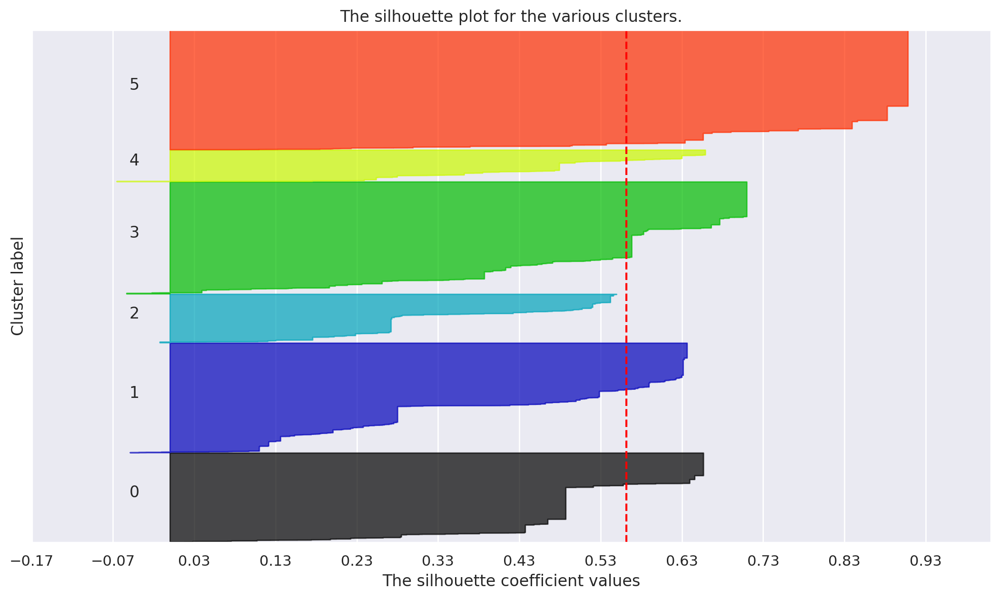

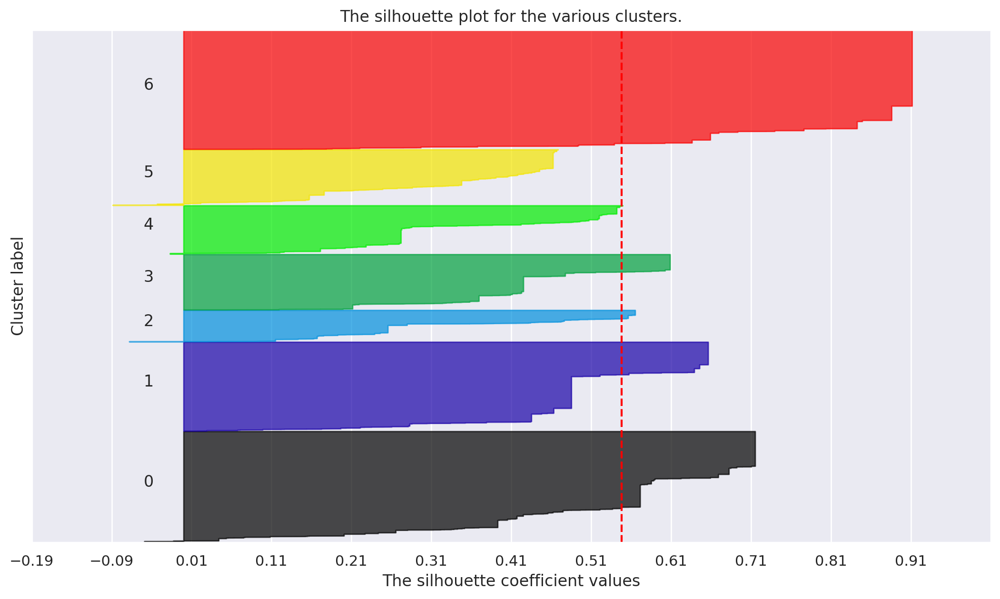

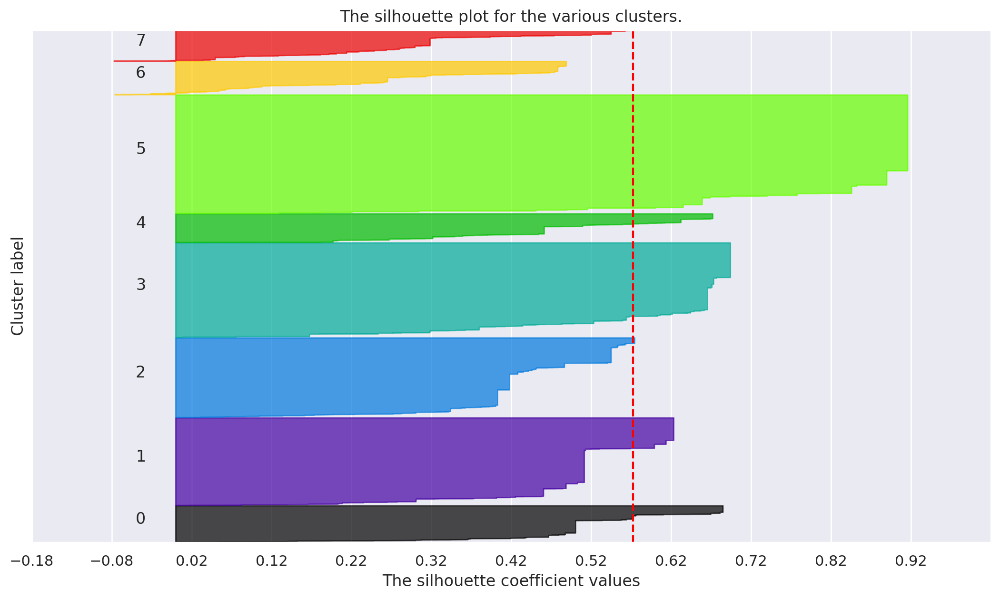

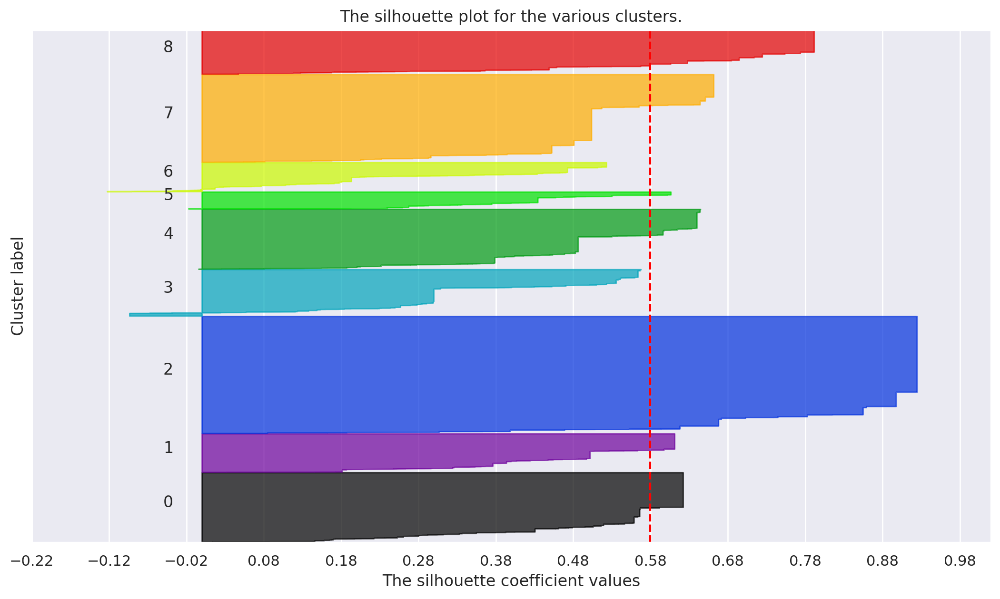

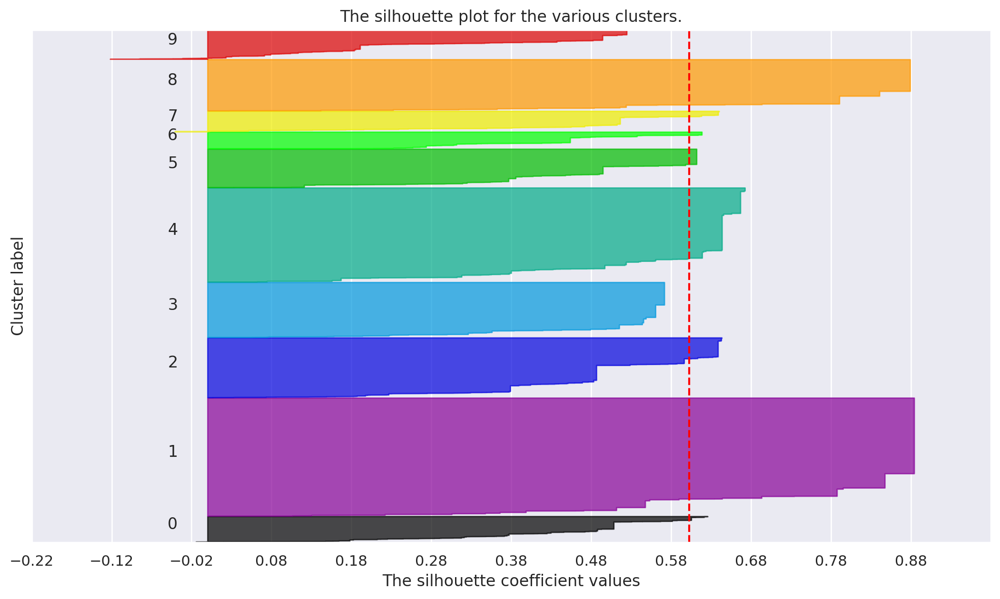

In [ ]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue

    # Create a figure
    fig = plt.figure(figsize=(13, 7))
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df)

    silhouette_avg = silhouette_score(df, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")

    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])

    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

**Conclusion**
- Optimal 4/5 number of clusters

In [ ]:
'''# final cluster solution (test with 4)
number_clusters = 4
kmclust4 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels4 = kmclust4.fit_predict(df)
km_labels4'''

"# final cluster solution (test with 4)\nnumber_clusters = 4\nkmclust4 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)\nkm_labels4 = kmclust4.fit_predict(df)\nkm_labels4"

In [ ]:
'''# Characterizing the final clusters
df_concat4 = pd.concat((df, pd.Series(km_labels4, name='labels',index = df.index)), axis=1)
df_concat4.groupby('labels').mean()'''

"# Characterizing the final clusters\ndf_concat4 = pd.concat((df, pd.Series(km_labels4, name='labels',index = df.index)), axis=1)\ndf_concat4.groupby('labels').mean()"

In [ ]:
'''print(silhouette(df,km_labels4))
print(r2(df,km_labels4))'''

'print(silhouette(df,km_labels4))\nprint(r2(df,km_labels4))'

In [ ]:
# final cluster solution (after test, 5 is better)
number_clusters = 5
kmclust5 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels5 = kmclust5.fit_predict(df)
km_labels5

array([0, 4, 2, ..., 2, 4, 3], dtype=int32)

In [ ]:
# Characterizing the final clusters
df_concat5 = pd.concat((df, pd.Series(km_labels5, name='labels',index = df.index)), axis=1)
df_concat5.groupby('labels').mean()

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals
labels,,,
0,-1.549266,-1.124176,-0.559033
1,0.596605,0.974013,-0.648761
2,0.593638,-0.609461,-0.310027
3,0.599290,0.745685,1.305794
4,-1.562866,-1.149156,1.306564


In [ ]:
print(silhouette(df,km_labels5))
print(r2(df,km_labels5))

0.5500734679754216
0.8252408192083399


#### **Density-Based**

##### **Mean Shift**

In [ ]:
bandwidth = estimate_bandwidth(df, quantile=0.3, random_state=1, n_jobs=-1)
bandwidth

1.6058296281335

In [ ]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(df)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 3


In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(ms_labels, index=df.index, name="ms_labels")], axis=1)
df_concat.head()
df_concat.groupby('ms_labels').mean()

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals
ms_labels,,,
0,0.602142,0.442983,-0.092042
1,-1.522682,-1.144327,0.232580
2,-0.346321,2.207370,0.070747


In [ ]:
print(silhouette(df,ms_labels))
print(r2(df,ms_labels))

0.42244761617263366
0.4861281077567142


##### **DBSCAN**

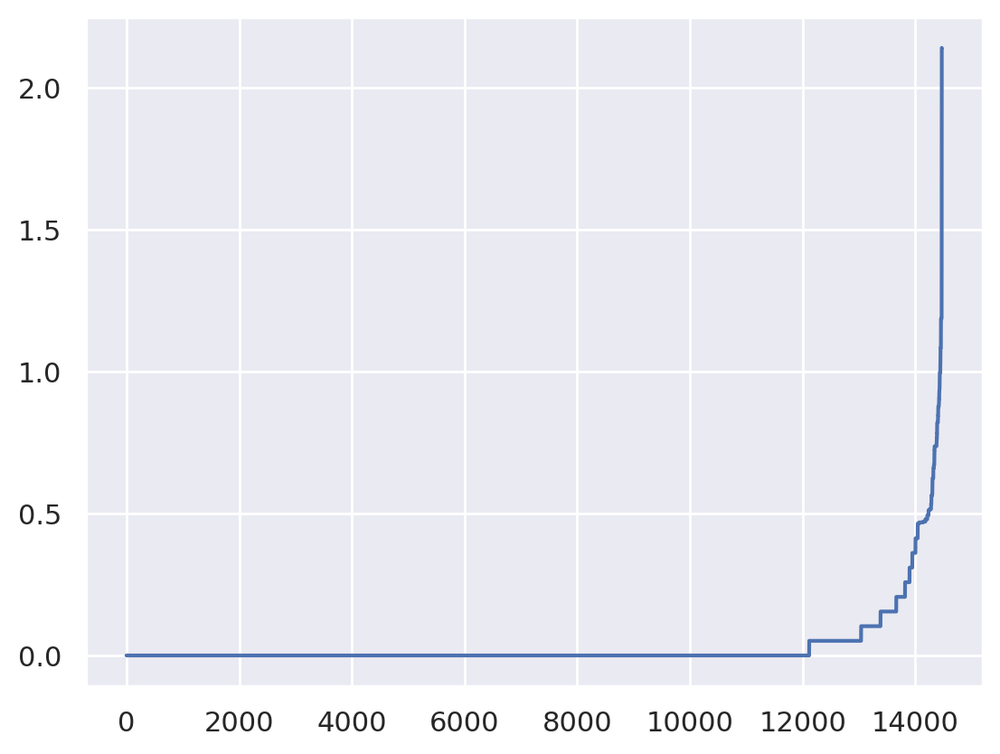

In [ ]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df)
distances, _ = neigh.kneighbors(df)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

**Conclusion**
- best value of ε seems to be around 0.4

In [ ]:
# Perform DBSCAN clustering (was 0.4, changed after minmax)
dbscan = DBSCAN(eps=0.4, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 33


In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.head()

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals,dbscan_labels
ID,,,,
0,-1.260716,-1.793459,-0.869329,0
1,-1.729636,-1.225600,0.605300,1
2,0.614966,-0.554493,-0.869329,2
3,-1.729636,-1.225600,-0.869329,3
4,0.614966,0.994216,1.342614,4


In [ ]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals,dbscan_labels
ID,,,,
22,-1.729636,1.407204,-0.132014,-1
23,-1.260716,-0.760987,1.342614,-1
109,-1.260716,0.374732,-0.869329,-1
113,-1.260716,0.374732,-0.869329,-1
171,-0.322875,-1.896707,-0.869329,-1
...,...,...,...,...
14605,-1.260716,0.581227,-0.869329,-1
14692,-1.260716,0.787721,-0.869329,-1
14739,-2.198556,-1.690212,2.817243,-1


In [ ]:
print(silhouette(df,dbscan_labels))
print(r2(df,dbscan_labels))

0.3015925819918543
0.8270696534452675


##### **Gaussian Mixture Model**

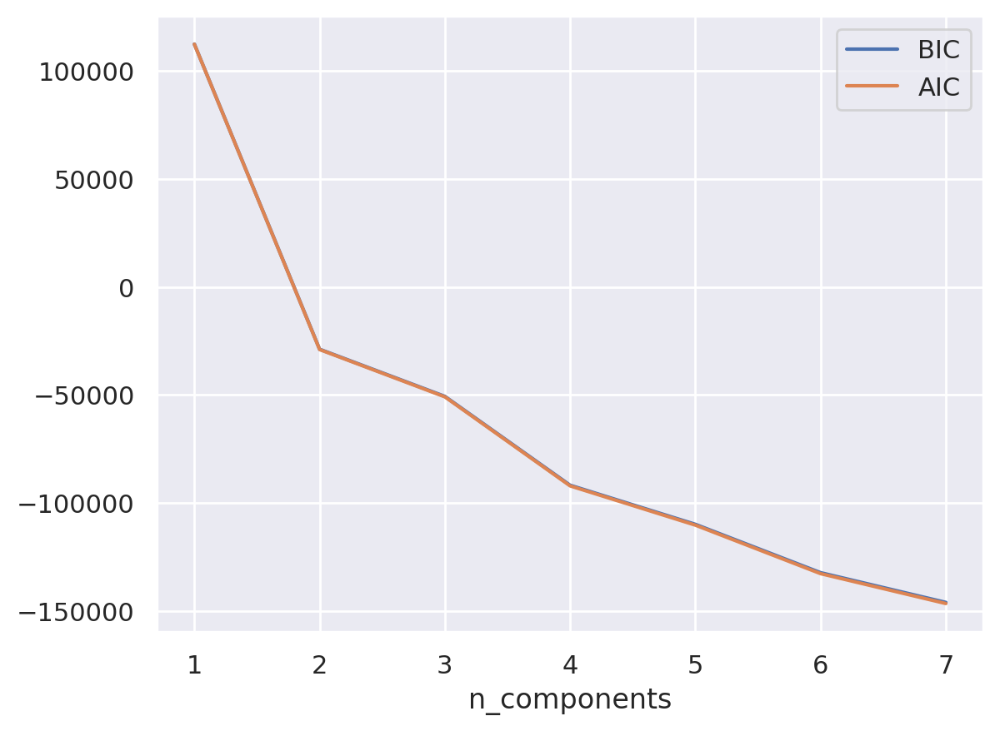

In [ ]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 8)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df)
          for n in n_components]

bic_values = [m.bic(df) for m in models]
aic_values = [m.aic(df) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

**Conclusion**
- elbow point seems to be around 2 n_components

In [ ]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=2, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df)

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)
df_concat.head()

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals,gmm_labels
ID,,,,
0,-1.260716,-1.793459,-0.869329,1
1,-1.729636,-1.225600,0.605300,1
2,0.614966,-0.554493,-0.869329,0
3,-1.729636,-1.225600,-0.869329,1
4,0.614966,0.994216,1.342614,0


In [ ]:
print(silhouette(df,gmm_labels))
print(r2(df,gmm_labels))

0.49266719148821586
0.4670476755577472


### **Merging Segments**

In [ ]:
df_final = pd.concat([df_engagement, df_service], axis=1)
final_features = df_final.columns
df_final.head(3)

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals
ID,,,,,,,
0,-0.099276,-0.536331,-0.495118,-0.643635,-1.260716,-1.793459,-0.869329
1,-0.328001,-0.701387,-0.265049,-0.133905,-1.729636,-1.225600,0.605300
2,-0.366122,0.123892,-0.544419,-0.591798,0.614966,-0.554493,-0.869329


In [ ]:
'''# For Engagement Segment use Mean Shift Clustering (best results)
bandwidth = estimate_bandwidth(df_engagement, quantile=0.3, random_state=1, n_jobs=-1)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(df_engagement)'''

'# For Engagement Segment use Mean Shift Clustering (best results)\nbandwidth = estimate_bandwidth(df_engagement, quantile=0.3, random_state=1, n_jobs=-1)\nms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)\nms_labels = ms.fit_predict(df_engagement)'

In [ ]:
# For Engagement Segment use KMeans Clustering (best results)
number_clusters = 4
kmclust1 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels1 = kmclust1.fit_predict(df_service)

In [ ]:
# For Service Segment use KMeans Clustering (best results)
number_clusters = 5
kmclust2 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels2 = kmclust2.fit_predict(df_service)

In [ ]:
df_final['engagement_labels'] = km_labels1
df_final['service_labels'] = km_labels2

In [ ]:
# Count label frequencies (contigency table)

pd.crosstab(df_final['engagement_labels'],
            df_final['service_labels'])

service_labels,0,1,2,3,4
engagement_labels,,,,,
0,2057,0,0,0,1615
1,18,4825,0,1,0
2,0,0,35,2422,101
3,218,2,3175,0,2


#### **Manual Merging**
(commented sinced we ended up not using)

In [ ]:
# df = df_final.copy()

In [ ]:
# metric_features.remove('Age')

In [ ]:
# # Centroids of clusters
# df_centroids2 = df.groupby(['engagement_labels', 'service_labels'])\
#     [metric_features].mean()


# # Clusters with low frequency to be merged:
# to_merge = [(1,0), (3,0), (3,1), (2,2), (1,3), (3,4), (2,4)]


# # Computing the euclidean distance matrix between the centroids
# euclidean = pairwise_distances(df_centroids2)
# df_dists = pd.DataFrame(
#     euclidean, columns=df_centroids2.index, index=df_centroids2.index
# )

# # Merging each low frequency clustering (source) to the closest cluster (target)
# source_target = {}
# for clus in to_merge:
#     if clus not in source_target.values():
#         source_target[clus] = df_dists.loc[clus].sort_values().index[1]

# source_target

In [ ]:
# df_manual = df.copy()

# for source, target in source_target.items():
#     mask = (df_manual['engagement_labels']==source[0]) & (df_manual['service_labels']==source[1])
#     df_manual.loc[mask, 'engagement_labels'] = target[0]
#     df_manual.loc[mask, 'service_labels'] = target[1]

# # New contigency table

# cross_table = pd.crosstab(df_manual['engagement_labels'],
#             df_manual['service_labels'])
# cross_table

In [ ]:
# # Setup merged_labels
# pair_to_label = {}
# label_counter = 0

# for engagement_label in cross_table.index:
#   for service_label in cross_table.columns:
#     count = cross_table.loc[engagement_label, service_label]

#     # Check count for 0
#     if count > 0:
#       pair_to_label[(engagement_label, service_label)] = label_counter
#       label_counter += 1

# df_manual['merged_labels'] = df_manual[['engagement_labels', 'service_labels']].apply(lambda x: pair_to_label.get(tuple(x), None), axis=1)

# df_manual.head()

#### **Hierarchical Merging**

In [ ]:
# Centroids of the concatenated cluster labels
df_centroids2 = df_final.groupby(['engagement_labels', 'service_labels']).mean()
df_centroids2

AttendedClasses  RealNumberOfVisits  \
engagement_labels service_labels                                        
0                 0                      0.115735           -0.255889   
                  4                      1.616188           -0.264679   
1                 0                     -0.325884            1.673581   
                  1                     -0.339284            0.062590   
                  3                     -0.137397            1.609393   
2                 2                     -0.359587           -0.036448   
                  3                     -0.168105            0.268435   
                  4                      2.878305            0.079768   
3                 0                     -0.003799           -0.164577   
                  1                      1.006230            1.774448   
                  2                     -0.341185           -0.001603   
                  4                      2.969456            0.288947   

                                  NumberOfFrequencies  DaysWithoutFrequency  \
engagement_labels service_labels                                              
0                 0                         -0.379165             -0.096289   
                  4                          0.341292              0.070512   
1                 0                         -0.414776             -0.592758   
                  1                         -0.248588             -0.129435   
                  3                          1.213969             -0.626356   
2                 2                          0.426568             -0.167475   
                  3                          0.918979              0.207370   
                  4                          1.124642              0.374628   
3                 0                         -0.425162             -0.283233   
                  1                          0.129356             -0.475165   
                  2                         -0.261105              0.078662   
                  4                          0.794914             -0.634996   

                                  AllowedWeeklyVisitsBySLA  \
engagement_labels service_labels                             
0                 0                              -1.635943   
                  4                              -1.617560   
1                 0                              -1.182562   
                  1                               0.596986   
                  3                               0.614966   
2                 2                               0.614966   
                  3                               0.599283   
                  4                              -0.722154   
3                 0                              -0.761681   
                  1                              -0.322875   
                  2                               0.593403   
                  4                               0.146045   

                                  AllowedNumberOfVisitsBySLA  NumberOfRenewals  
engagement_labels service_labels                                                
0                 0                                -1.205472         -0.523433  
                  4                                -1.192100          1.230305  
1                 0                                 0.449300         -0.869329  
                  1                                 0.974369         -0.648669  
                  3                                 2.801042          0.605300  
2                 2                                -0.647415          1.047688  
                  3                                 0.744836          1.306083  
                  4                                -0.459935          2.525237  
3                 0                                -0.487003         -0.869329  
                  1                                 0.116614         -0.869329  
                  2                                -0.609043   

In [ ]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward',
    affinity='euclidean',
    distance_threshold=0,
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids2)

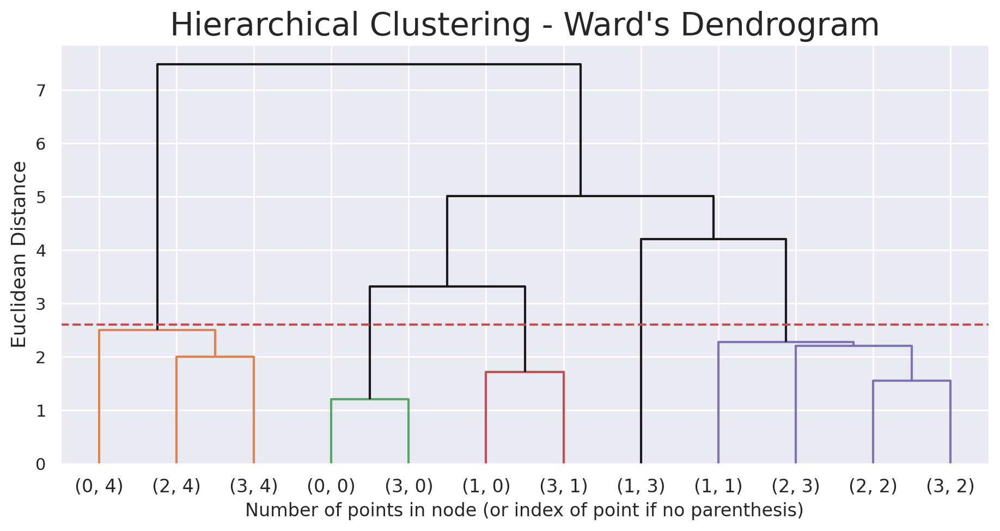

In [ ]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 2.6
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids2.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [ ]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward',
    affinity='euclidean',
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids2)
df_centroids2['hclust_labels'] = hclust_labels

df_centroids2  # centroid's cluster labels

AttendedClasses  RealNumberOfVisits  \
engagement_labels service_labels                                        
0                 0                      0.115735           -0.255889   
                  4                      1.616188           -0.264679   
1                 0                     -0.325884            1.673581   
                  1                     -0.339284            0.062590   
                  3                     -0.137397            1.609393   
2                 2                     -0.359587           -0.036448   
                  3                     -0.168105            0.268435   
                  4                      2.878305            0.079768   
3                 0                     -0.003799           -0.164577   
                  1                      1.006230            1.774448   
                  2                     -0.341185           -0.001603   
                  4                      2.969456            0.288947   

                                  NumberOfFrequencies  DaysWithoutFrequency  \
engagement_labels service_labels                                              
0                 0                         -0.379165             -0.096289   
                  4                          0.341292              0.070512   
1                 0                         -0.414776             -0.592758   
                  1                         -0.248588             -0.129435   
                  3                          1.213969             -0.626356   
2                 2                          0.426568             -0.167475   
                  3                          0.918979              0.207370   
                  4                          1.124642              0.374628   
3                 0                         -0.425162             -0.283233   
                  1                          0.129356             -0.475165   
                  2                         -0.261105              0.078662   
                  4                          0.794914             -0.634996   

                                  AllowedWeeklyVisitsBySLA  \
engagement_labels service_labels                             
0                 0                              -1.635943   
                  4                              -1.617560   
1                 0                              -1.182562   
                  1                               0.596986   
                  3                               0.614966   
2                 2                               0.614966   
                  3                               0.599283   
                  4                              -0.722154   
3                 0                              -0.761681   
                  1                              -0.322875   
                  2                               0.593403   
                  4                               0.146045   

                                  AllowedNumberOfVisitsBySLA  \
engagement_labels service_labels                               
0                 0                                -1.205472   
                  4                                -1.192100   
1                 0                                 0.449300   
                  1                                 0.974369   
                  3                                 2.801042   
2                 2                                -0.647415   
                  3                                 0.744836   
                  4                                -0.459935   
3                 0                                -0.487003   
                  1                                 0.116614   
                  2                                -0.609043   
                  4                                -1.277223   

                                  NumberOfRenewals  hclust_labels  
engagement_labels service_labels                                   
0 

In [ ]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids2['hclust_labels'].to_dict()

df_hc = df_final.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_hc['merged_labels'] = df_hc.apply(
    lambda row: cluster_mapper[
        (row['engagement_labels'], row['service_labels'])
    ], axis=1
)

# Merged cluster centroids
df_hc.groupby('merged_labels').mean()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals,engagement_labels,service_labels
merged_labels,,,,,,,,,
0,0.101693,-0.230313,-0.383370,-0.118271,-1.548197,-1.123095,-0.559303,0.295425,0.000871
1,1.691962,-0.243785,0.387873,0.087569,-1.562866,-1.149156,1.306564,0.121071,4.000000
2,-0.300281,0.090445,0.020298,0.011630,0.596491,0.435015,-0.091965,1.842211,1.770202
3,-0.137397,1.609393,1.213969,-0.626356,0.614966,2.801042,0.605300,1.000000,3.000000


In [ ]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_hc.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['engagement_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['service_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('engagement_labels', 'service_labels', 0)

service_labels,1,2,3,4
engagement_labels,,,,
1,NaN,NaN,1.0,NaN
3,2295.0,10457.0,NaN,1718.0


## **Cluster Analysis**

In [ ]:
df = df_hc.copy()
#df = df_manual.copy() if want to use manual

In [ ]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels.
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)

    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)

        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]

        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["{}".format(i+1) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy')
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("Cluster")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)

    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

### **Final Clusters**

#### **Using 4 Clusters**

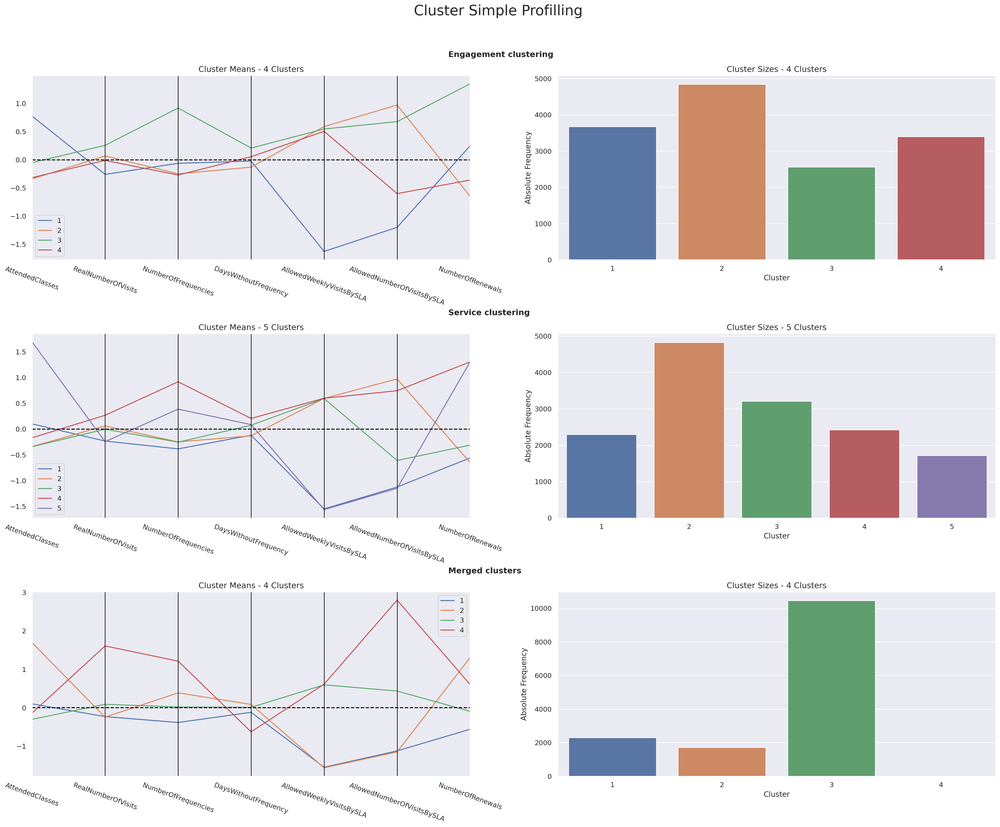

In [ ]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df,
    label_columns = ['engagement_labels', 'service_labels', 'merged_labels'],
    figsize = (28, 20),
    compar_titles = ["Engagement clustering", "Service clustering", "Merged clusters"]
)

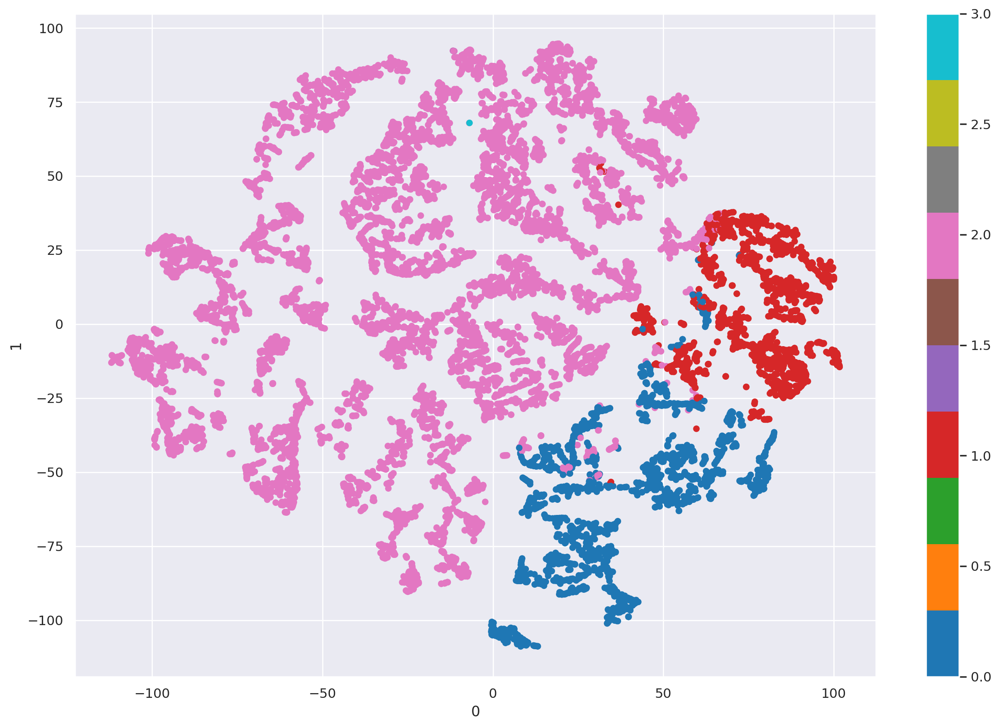

In [ ]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df[final_features])

# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

#### **Try 5 final Clusters**

In [ ]:
hclust = AgglomerativeClustering(
    linkage='ward',
    affinity='euclidean',
    n_clusters=5
)
hclust_labels = hclust.fit_predict(df_centroids2)
df_centroids2['hclust_labels'] = hclust_labels

In [ ]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids2['hclust_labels'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_hc['merged_labels'] = df_hc.apply(
    lambda row: cluster_mapper[
        (row['engagement_labels'], row['service_labels'])
    ], axis=1
)

# Merged cluster centroids
df_hc.groupby('merged_labels').mean()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals,engagement_labels,service_labels
merged_labels,,,,,,,,,
0,1.691962,-0.243785,0.387873,0.087569,-1.562866,-1.149156,1.306564,0.121071,4.000000
1,-0.192672,1.683668,-0.360363,-0.580999,-1.096593,0.416031,-0.869329,1.200000,0.100000
2,-0.300281,0.090445,0.020298,0.011630,0.596491,0.435015,-0.091965,1.842211,1.770202
3,-0.137397,1.609393,1.213969,-0.626356,0.614966,2.801042,0.605300,1.000000,3.000000
4,0.104281,-0.247139,-0.383572,-0.114203,-1.552168,-1.136625,-0.556578,0.287473,0.000000


In [ ]:
df = df_hc.copy()

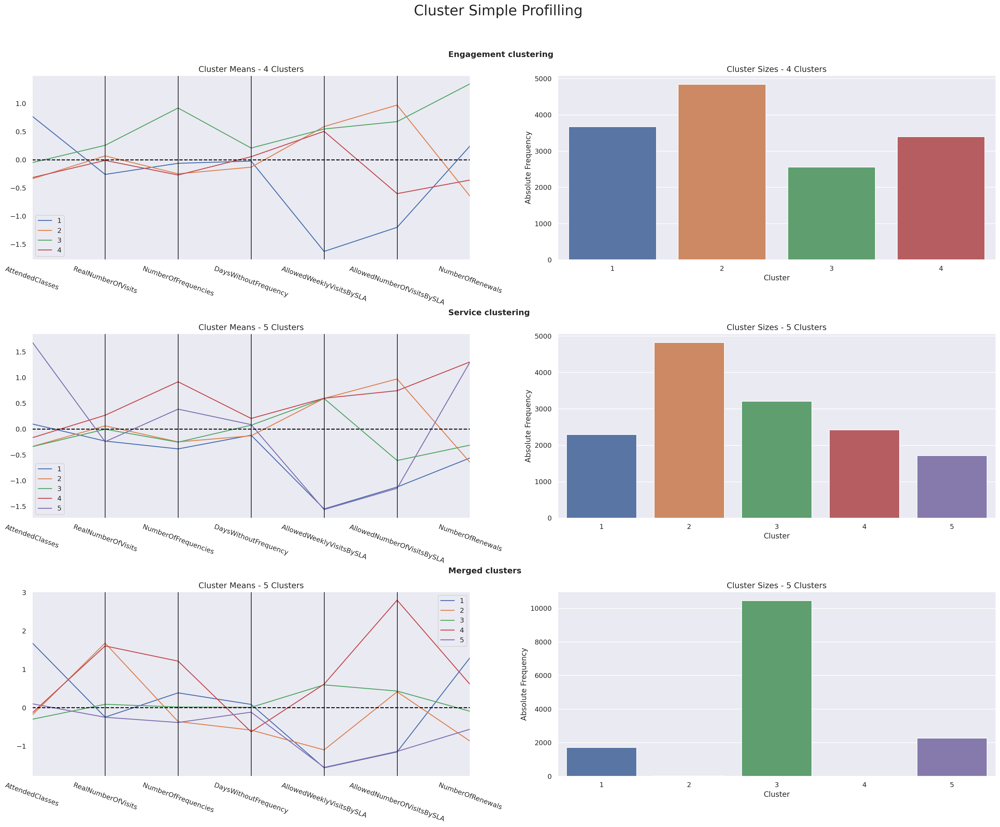

In [ ]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df,
    label_columns = ['engagement_labels', 'service_labels', 'merged_labels'],
    figsize = (28, 20),
    compar_titles = ["Engagement clustering", "Service clustering", "Merged clusters"]
)

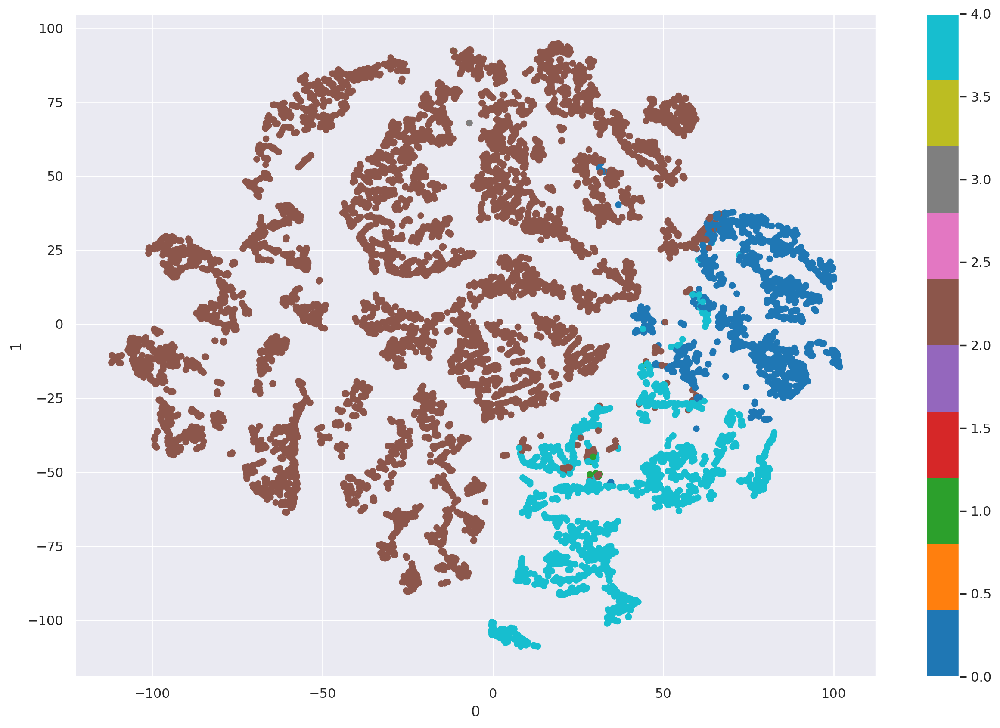

In [ ]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df[final_features])
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

#### **Try 3 final Clusters**

In [ ]:
hclust = AgglomerativeClustering(
    linkage='ward',
    affinity='euclidean',
    n_clusters=3
)
hclust_labels = hclust.fit_predict(df_centroids2)
df_centroids2['hclust_labels'] = hclust_labels

In [ ]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids2['hclust_labels'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_hc['merged_labels'] = df_hc.apply(
    lambda row: cluster_mapper[
        (row['engagement_labels'], row['service_labels'])
    ], axis=1
)

# Merged cluster centroids
df_hc.groupby('merged_labels').mean()

,AttendedClasses,RealNumberOfVisits,NumberOfFrequencies,DaysWithoutFrequency,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,NumberOfRenewals,engagement_labels,service_labels
merged_labels,,,,,,,,,
0,-0.300060,0.093631,0.019685,0.010438,0.593261,0.435204,-0.093383,1.840905,1.767131
1,1.691962,-0.243785,0.387873,0.087569,-1.562866,-1.149156,1.306564,0.121071,4.000000
2,0.104281,-0.247139,-0.383572,-0.114203,-1.552168,-1.136625,-0.556578,0.287473,0.000000


In [ ]:
df = df_hc.copy()

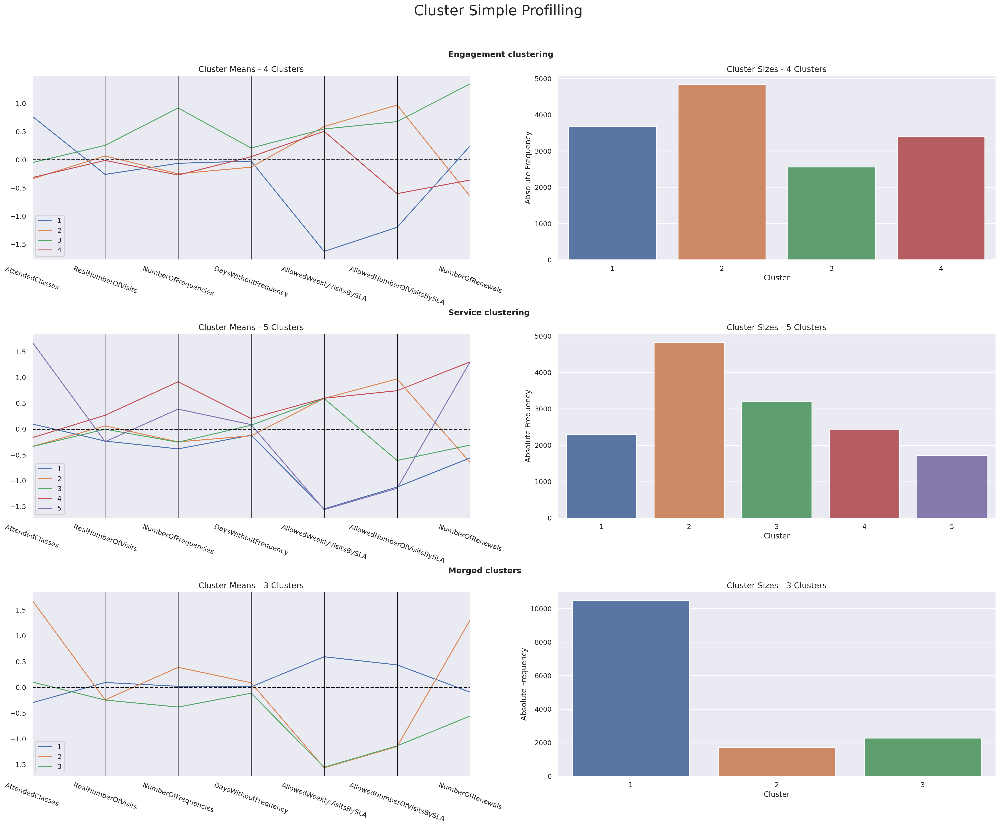

In [ ]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df,
    label_columns = ['engagement_labels', 'service_labels', 'merged_labels'],
    figsize = (28, 20),
    compar_titles = ["Engagement clustering", "Service clustering", "Merged clusters"]
)

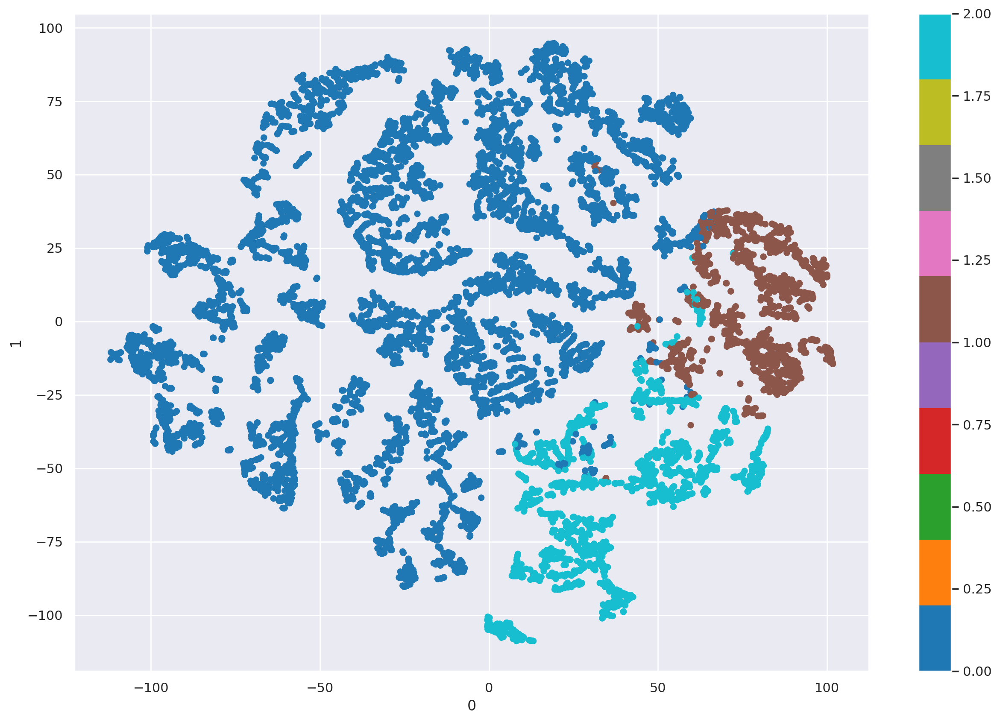

In [ ]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df[final_features])

# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

#### **Conclusion**

After trying 3 different numbers of clusters, we concluded **using 3** would give better visualization of costumer segmentation in the Facility, giving off the following clusters:

***CLUSTER 1 - 'The Overconfidents'***
- **most of the costumers**
- People who attend least classes, however are somewhat active, and request services with most allowed visits

***CLUSTER 2 - 'Mr. Consistents'***
-  Those who attend most classes, not very periodicaly active, however consistently attending the facility, low nr of weekly visits, and the ones who renew their membership the most

***CLUSTER 3 - 'The "Tried Once, didn't like it"'***
- Least engagement in the facility, and request services with low number of visits

### **Assess feature importance and reclassify outliers**

**Using the R²**

What proportion of each variables total SS is explained between clusters?

In [ ]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [ ]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(df[final_features.to_list() + ['merged_labels']], 'merged_labels').drop('merged_labels')

AttendedClasses               0.406766
RealNumberOfVisits            0.023005
NumberOfFrequencies           0.041272
DaysWithoutFrequency          0.003040
AllowedWeeklyVisitsBySLA      0.923579
AllowedNumberOfVisitsBySLA    0.497021
NumberOfRenewals              0.257683
dtype: float64

**Using a Decision Tree**

We get the normalized total reduction of the criterion (gini or entropy) brought by that feature (also known as Gini importance).

In [ ]:
# Preparing the data
X = df.drop(columns=['engagement_labels','service_labels','merged_labels'])
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 99.90% of the customers correctly


In [ ]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

AttendedClasses               0.000000
RealNumberOfVisits            0.000000
NumberOfFrequencies           0.000000
DaysWithoutFrequency          0.000000
AllowedWeeklyVisitsBySLA      0.678078
AllowedNumberOfVisitsBySLA    0.017931
NumberOfRenewals              0.303990
dtype: float64